# Analytics - query to reference mapping  

This notebook is based on and adapted from this scvi-tools tutorial: https://docs.scvi-tools.org/en/stable/tutorials/notebooks/query_hlca_knn.html

In [50]:
import scvi
import mplscience
import matplotlib.pyplot as plt
import os
import pynndescent
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns
from scvi.data._download import _download
import anndata

scvi.settings.seed = 1

# plotting commands for the styling
mplscience.set_style(reset_current=True, name="default")

%load_ext autoreload
%autoreload 2

Global seed set to 1


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Citations

scArches:  
Mohammad Lotfollahi, Mohsen Naghipourfar, Malte D. Luecken, Matin Khajavi, Maren Büttner, Marco Wagenstetter, Žiga Avsec, Adam Gayoso, Nir Yosef, Marta Interlandi, Sergei Rybakov, Alexander V. Misharin, and Fabian J. Theis. Mapping single-cell data to reference atlases by transfer learning. Nature Biotechnology, 40(1):121–130, August 2021. doi:10.1038/s41587-021-01001-7.  

scANVI:  
Chenling Xu, Romain Lopez, Edouard Mehlman, Jeffrey Regier, Michael I Jordan, and Nir Yosef. Probabilistic harmonization and annotation of single-cell transcriptomics data with deep generative models. Molecular Systems Biology, January 2021. doi:10.15252/msb.20209620.

Sikkema, L., Ramírez-Suástegui, C., Strobl, D.C. et al. An integrated cell atlas of the lung in health and disease. Nat Med 29, 1563–1577 (2023). https://doi.org/10.1038/s41591-023-02327-2

## 1️⃣ Download the pre-trained model

Here we use the HLCA dataset.

Sikkema, L., Ramírez-Suástegui, C., Strobl, D.C. et al. An integrated cell atlas of the lung in health and disease. Nat Med 29, 1563–1577 (2023). https://doi.org/10.1038/s41591-023-02327-2

Let's download the pre-trained model

In [51]:
local_dir = "/home/cane/Documents/yoseflab/can/scvi-hub"

In [52]:
model_url = "https://huggingface.co/scvi-tools/human-lung-cell-atlas/resolve/main/model.pt"
_download(model_url, local_dir, "model.pt")

INFO     File /home/cane/Documents/yoseflab/can/scvi-hub/model.pt already downloaded                               


## 2️⃣ Download the query data

For the query, we will use samples from the following publication:  

- Delorey, Toni M., et al. “COVID-19 tissue atlases reveal SARS-CoV-2 pathology and cellular targets.” Nature 595.7865 (2021): 107-113.

In [4]:
from scvi.data import cellxgene
adata_url = "https://cellxgene.cziscience.com/e/ae29ebd0-1973-40a4-a6af-d15a5f77a80f.cxg/"
query_data = cellxgene(adata_url, filename="pan_immune_cells.h5ad", save_path=local_dir)

In [5]:
query_data = query_data[query_data.obs['tissue'] == 'lung']

In [6]:
# add dataset information:
query_data.obs['dataset'] = "pan_immune_cell"

/tmp/ipykernel_2333637/455780152.py:2: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  query_data.obs['dataset'] = "pan_immune_cell"


In [7]:
query_data

AnnData object with n_obs × n_vars = 8852 × 36503
    obs: 'donor_id', 'Predicted_labels_CellTypist', 'Majority_voting_CellTypist', 'Manually_curated_celltype', 'assay_ontology_term_id', 'cell_type_ontology_term_id', 'development_stage_ontology_term_id', 'disease_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'is_primary_data', 'organism_ontology_term_id', 'sex_ontology_term_id', 'tissue_ontology_term_id', 'suspension_type', 'cell_type', 'assay', 'disease', 'organism', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'dataset'
    var: 'gene_symbols', 'feature_is_filtered', 'feature_name', 'feature_reference', 'feature_biotype'
    uns: 'cell_type_ontology_term_id_colors', 'default_embedding', 'schema_version', 'sex_ontology_term_id_colors', 'title'
    obsm: 'X_umap'

## 3️⃣ Build a query model

Use `prepare_query_anndata` to re-order the genes and pad any missing genes with 0s, so that query_adata matches exactly the reference in terms of its gene set.  

In [8]:
scvi.model.SCANVI.prepare_query_anndata(query_data, local_dir)

INFO     File /home/cane/Documents/yoseflab/can/scvi-hub/model.pt already downloaded                               
INFO     Found 99.55000000000001% reference vars in query data.                                                    


/home/cane/miniconda3/envs/resolvi/lib/python3.10/site-packages/anndata/_core/merge.py:1111: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


In [9]:
query_data.obs["scanvi_label"] = "unlabeled"

In [10]:
query_model = scvi.model.SCANVI.load_query_data(query_data, local_dir, accelerator = "cpu")

INFO     File /home/cane/Documents/yoseflab/can/scvi-hub/model.pt already downloaded                               


No GPU/TPU found, falling back to CPU. (Set TF_CPP_MIN_LOG_LEVEL=0 and rerun for more info.)


/home/cane/miniconda3/envs/resolvi/lib/python3.10/site-packages/scvi/data/fields/_base_field.py:64: UserWarning: adata.X does not contain unnormalized count data. Are you sure this is what you want?
  self.validate_field(adata)


In [11]:
query_model.adata

AnnData object with n_obs × n_vars = 8852 × 2000
    obs: 'donor_id', 'Predicted_labels_CellTypist', 'Majority_voting_CellTypist', 'Manually_curated_celltype', 'assay_ontology_term_id', 'cell_type_ontology_term_id', 'development_stage_ontology_term_id', 'disease_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'is_primary_data', 'organism_ontology_term_id', 'sex_ontology_term_id', 'tissue_ontology_term_id', 'suspension_type', 'cell_type', 'assay', 'disease', 'organism', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'dataset', 'scanvi_label', '_scvi_batch', '_scvi_labels'
    var: 'gene_symbols', 'feature_is_filtered', 'feature_name', 'feature_reference', 'feature_biotype'
    uns: '_scvi_uuid', '_scvi_manager_uuid'
    obsm: 'X_umap'

Train the query model.

In [12]:
surgery_epochs = 500
train_kwargs_surgery = {
    "early_stopping": True,
    "early_stopping_monitor": "elbo_train",
    "early_stopping_patience": 10,
    "early_stopping_min_delta": 0.001,
    "plan_kwargs": {"weight_decay": 0.0},
}

In [13]:
query_model.train(
    max_epochs=surgery_epochs,
    accelerator="cpu",
    **train_kwargs_surgery,
)

INFO     Training for 500 epochs.                                                                                  


GPU available: True (cuda), used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/home/cane/miniconda3/envs/resolvi/lib/python3.10/site-packages/lightning/pytorch/trainer/setup.py:176: PossibleUserWarning: GPU available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='gpu', devices=1)`.
  rank_zero_warn(


Epoch 129/500:  26%|██▌       | 129/500 [03:33<10:13,  1.65s/it, v_num=1, train_loss_step=543, train_loss_epoch=539]
Monitored metric elbo_train did not improve in the last 10 records. Best score: 607.126. Signaling Trainer to stop.


In [14]:
query_save_path = f"{local_dir}/query_model_pan_immune"
query_model.save(query_save_path, overwrite=True)

In [16]:
query_data.obsm['X_scanvi_emb'] = query_model.get_latent_representation()

## 4️⃣ Learn a neighbors index on reference latent space  

Get the "latent space" from our embeddings. It is essentially just the mean of the latent distribution.

In [17]:
from scvi.data import cellxgene

adata_url = "https://cellxgene.cziscience.com/e/066943a2-fdac-4b29-b348-40cede398e4e.cxg/"
adata = cellxgene(adata_url, filename="adata.h5ad", save_path=local_dir)

In [18]:
adata

AnnData object with n_obs × n_vars = 584944 × 28024
    obs: 'suspension_type', 'donor_id', 'is_primary_data', 'assay_ontology_term_id', 'cell_type_ontology_term_id', 'development_stage_ontology_term_id', 'disease_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'tissue_ontology_term_id', 'organism_ontology_term_id', 'sex_ontology_term_id', 'BMI', 'age_or_mean_of_age_range', 'age_range', 'anatomical_region_ccf_score', 'ann_coarse_for_GWAS_and_modeling', 'ann_finest_level', 'ann_level_1', 'ann_level_2', 'ann_level_3', 'ann_level_4', 'ann_level_5', 'cause_of_death', 'dataset', 'entropy_dataset_leiden_3', 'entropy_original_ann_level_1_leiden_3', 'entropy_original_ann_level_2_clean_leiden_3', 'entropy_original_ann_level_3_clean_leiden_3', 'entropy_subject_ID_leiden_3', 'fresh_or_frozen', 'leiden_1', 'leiden_2', 'leiden_3', 'leiden_4', 'leiden_5', 'log10_total_counts', 'lung_condition', 'mixed_ancestry', 'n_genes_detected', 'original_ann_highest_res', 'original_ann_level_1', '

In [19]:
ref = adata.obsm['X_scanvi_emb']
ref_nn_index = pynndescent.NNDescent(ref)
ref_nn_index.prepare()

## 5️⃣ Predict cell types

Let's predict using a different cell type than we did earlier, as that is too coarse grained (compartment-level resolution).

In [21]:
ref_neighbors, ref_distances = ref_nn_index.query(query_data.obsm['X_scanvi_emb'])

In [22]:
def distances_to_affinities(distances):
    # convert distances to affinities
    stds = np.std(distances, axis=1)
    stds = (2.0 / stds) ** 2
    stds = stds.reshape(-1, 1)
    distances_tilda = np.exp(-np.true_divide(distances, stds))
    weights = distances_tilda / np.sum(
        distances_tilda, axis=1, keepdims=True
    )
    return weights

# import numba
# @numba.njit
def weighted_prediction(weights, ref_cats):
    """Get highest weight category."""
    N = len(weights)
    predictions = np.zeros((N,), dtype=ref_cats.dtype)
    uncertainty = np.zeros((N,))
    for i in range(N):
        obs_weights = weights[i]
        obs_cats = ref_cats[i]
        best_prob = 0
        for c in np.unique(obs_cats):
            cand_prob = np.sum(obs_weights[obs_cats == c])
            if cand_prob > best_prob:
                best_prob = cand_prob
                predictions[i] = c
                uncertainty[i] = max(1 - best_prob, 0)

    return predictions, uncertainty

weights = distances_to_affinities(ref_distances)

### Predict

In [23]:
label_key = "ann_level_3"
ref_cats = adata.obs[label_key].cat.codes.to_numpy()[ref_neighbors]
p, u = weighted_prediction(weights, ref_cats)
p = np.asarray(adata.obs[label_key].cat.categories)[p]
query_data.obs["celltype_pred"], query_data.obs["celltype_uncertainty"] = p, u

### Evaluate predictions

Finally, let's evaluate predictions.

In [25]:
query_data.obs[["celltype_pred", "celltype_uncertainty"]]

,celltype_pred,celltype_uncertainty
Pan_T7935492_AAACCTGAGGCTACGA,T cell lineage,0.000000e+00
Pan_T7935492_AAACCTGTCGGTTAAC,Innate lymphoid cell NK,0.000000e+00
Pan_T7935492_AAACGGGAGGTGTTAA,T cell lineage,0.000000e+00
Pan_T7935492_AAACGGGGTCCGACGT,T cell lineage,0.000000e+00
Pan_T7935492_AAAGATGAGTGTCCAT,Basal,0.000000e+00
...,...,...
CZINY-0112_TTCGGTCCATCGAGCC,T cell lineage,0.000000e+00
CZINY-0112_TTGAACGCATACCAGT,Innate lymphoid cell NK,4.000075e-01
CZINY-0112_TTGCGTCAGCCTGGAA,T cell lineage,5.960464e-08
CZINY-0112_TTGTTCACAGTAACAA,Innate lymphoid cell NK,2.000070e-01


0.026072868052996287 5.960464477539063e-08


<Axes: ylabel='Density'>

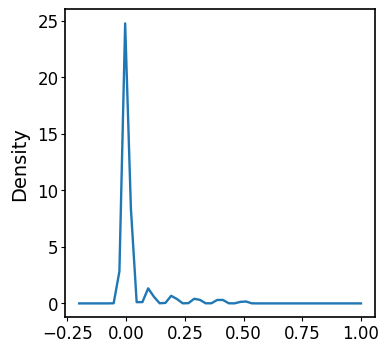

In [26]:
print(query_data.obs["celltype_uncertainty"].mean(), np.quantile(query_data.obs["celltype_uncertainty"], 0.75))
query_data.obs["celltype_uncertainty"].plot(kind='density', ind=np.linspace(-0.2, 1))

In [27]:
def get_comparison_df(uncertainty_threshold = None):
    # build comparison_df
    comparison_df = pd.DataFrame(index=query_data.obs_names, columns=["pred", "ground_truth", "pred_uncertainty"])
    comparison_df["pred"] = query_data.obs["celltype_pred"]
    comparison_df["pred_uncertainty"] = query_data.obs["celltype_uncertainty"]
    comparison_df["ground_truth"] = query_data.obs["Manually_curated_celltype"].fillna("Unknown")

    # we dont care about cases where we dont know the ground truth (in fact we could have skipped prediction for these altogether)
    n_before = len(comparison_df)
    comparison_df = comparison_df[comparison_df["ground_truth"] != "Unknown"]
    n_filtered = n_before-len(comparison_df)
    pct_filtered = 100*n_filtered/n_before
    print(f"filtered out {n_filtered} barcodes ({pct_filtered:.2f}%) with unknown ground truth")

    if uncertainty_threshold is not None:
        # filter out uncertainty > threshold
        n_before = len(comparison_df)
        comparison_df = comparison_df[comparison_df["pred_uncertainty"] <= uncertainty_threshold]
        n_filtered = n_before-len(comparison_df)
        pct_filtered = 100*n_filtered/n_before
        print(f"filtered out {n_filtered} barcodes ({pct_filtered:.2f}%) with pred uncertainty < {uncertainty_threshold}")

    return comparison_df

In [28]:
comparison_df = get_comparison_df(uncertainty_threshold=0.2)

filtered out 0 barcodes (0.00%) with unknown ground truth
filtered out 457 barcodes (5.16%) with pred uncertainty < 0.2


## 6️⃣ Plot
Let's plot heatmap

In [29]:
temp_fig_dir = "/home/cane/Documents/yoseflab/can/scvi-hub/query_ref/"

In [30]:
comparison_df

,pred,ground_truth,pred_uncertainty
Pan_T7935492_AAACCTGAGGCTACGA,T cell lineage,T_CD4/CD8,0.000000e+00
Pan_T7935492_AAACCTGTCGGTTAAC,Innate lymphoid cell NK,NK_CD16+,0.000000e+00
Pan_T7935492_AAACGGGAGGTGTTAA,T cell lineage,Tem/emra_CD8,0.000000e+00
Pan_T7935492_AAACGGGGTCCGACGT,T cell lineage,Trm_Th1/Th17,0.000000e+00
Pan_T7935492_AAAGATGAGTGTCCAT,Basal,Cycling T&NK,0.000000e+00
...,...,...,...
CZINY-0112_TTATTGCGTTATAGAG,Innate lymphoid cell NK,NK_CD16+,0.000000e+00
CZINY-0112_TTCCAATGTATCGTGT,Innate lymphoid cell NK,NK_CD16+,0.000000e+00
CZINY-0112_TTCGGTCCATCGAGCC,T cell lineage,Tgd_CRTAM+,0.000000e+00
CZINY-0112_TTGCGTCAGCCTGGAA,T cell lineage,NK_CD16+,5.960464e-08


In [31]:
comparison_df["pred"].value_counts()

T cell lineage             5570
Innate lymphoid cell NK    2817
Basal                         3
Multiciliated lineage         3
Mast cells                    2
Name: pred, dtype: int64

In [32]:
comparison_df.groupby("pred")["pred_uncertainty"].mean()

pred
Basal                      1.986821e-08
Innate lymphoid cell NK    1.952371e-02
Mast cells                 9.997326e-02
Multiciliated lineage      1.986821e-08
T cell lineage             3.572552e-03
Name: pred_uncertainty, dtype: float64

In [33]:
comparison_df = comparison_df.loc[comparison_df["pred"].isin(["T cell lineage", "Innate lymphoid cell NK"])]
comparison_df["pred"].value_counts()

T cell lineage             5570
Innate lymphoid cell NK    2817
Name: pred, dtype: int64

Some notes on the new HLCA annotations (https://zenodo.org/record/6337966/ vs https://zenodo.org/record/7599104):
- All new 60 cells have None for ann_level_3 annotations.
- No cells was predicted as "Smooth muscle FAM83D+" (even before thresholding on prediction uncertainty)
- In prev ann_level_3, not in new: 'Fibromyocytes'
- In new ann_level_3, not in prev: 'Smooth muscle FAM83D+'
- Only 565 cells differ between prev and new ann_level_3 annotations and their distribution is (prev, new):  
Fibromyocytes,Smooth muscle FAM83D+   -> 335  
Secretory,AT2                       ->   230

In [34]:
# https://docs.scvi-tools.org/en/stable/tutorials/notebooks/cellassign_tutorial.html#Model-reproducibility
confusion_matrix = pd.crosstab(
    comparison_df["pred"],
    comparison_df["ground_truth"], 
    rownames=["Predicted label"],
    colnames=["True label"],
)
confusion_matrix /= confusion_matrix.sum(1).ravel().reshape(-1, 1)
confusion_matrix *= 100

<Axes: xlabel='True label', ylabel='Predicted label'>

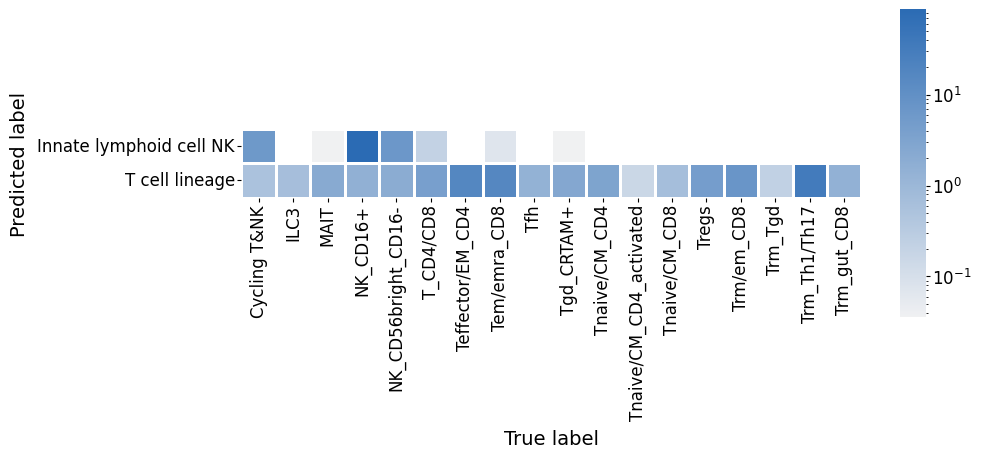

In [35]:
from matplotlib.colors import LogNorm, Normalize

fig, ax = plt.subplots(figsize=(10, 10))
sns.heatmap(
    confusion_matrix,
    # cmap=sns.diverging_palette(245, 320, s=60, as_cmap=True),
    cmap=sns.color_palette("light:#2b6bb4", as_cmap=True),
    ax=ax,
    square=True,
    fmt=".2f",
    cbar_kws=dict(shrink=0.4, aspect=12),
    linecolor='white',
    linewidths=1, 
    # annot=True,
    norm=LogNorm()
)

## 7️⃣ Visualize embeddings in the joint latent space

Combine embeddings

In [37]:
query_data.obs["dataset"] = "pan_immune"
query_data

AnnData object with n_obs × n_vars = 8852 × 2000
    obs: 'donor_id', 'Predicted_labels_CellTypist', 'Majority_voting_CellTypist', 'Manually_curated_celltype', 'assay_ontology_term_id', 'cell_type_ontology_term_id', 'development_stage_ontology_term_id', 'disease_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'is_primary_data', 'organism_ontology_term_id', 'sex_ontology_term_id', 'tissue_ontology_term_id', 'suspension_type', 'cell_type', 'assay', 'disease', 'organism', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'dataset', 'scanvi_label', '_scvi_batch', '_scvi_labels', 'celltype_pred', 'celltype_uncertainty'
    var: 'gene_symbols', 'feature_is_filtered', 'feature_name', 'feature_reference', 'feature_biotype'
    uns: '_scvi_uuid', '_scvi_manager_uuid'
    obsm: 'X_umap', 'X_scanvi_emb'

In [38]:
adata

AnnData object with n_obs × n_vars = 584944 × 28024
    obs: 'suspension_type', 'donor_id', 'is_primary_data', 'assay_ontology_term_id', 'cell_type_ontology_term_id', 'development_stage_ontology_term_id', 'disease_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'tissue_ontology_term_id', 'organism_ontology_term_id', 'sex_ontology_term_id', 'BMI', 'age_or_mean_of_age_range', 'age_range', 'anatomical_region_ccf_score', 'ann_coarse_for_GWAS_and_modeling', 'ann_finest_level', 'ann_level_1', 'ann_level_2', 'ann_level_3', 'ann_level_4', 'ann_level_5', 'cause_of_death', 'dataset', 'entropy_dataset_leiden_3', 'entropy_original_ann_level_1_leiden_3', 'entropy_original_ann_level_2_clean_leiden_3', 'entropy_original_ann_level_3_clean_leiden_3', 'entropy_subject_ID_leiden_3', 'fresh_or_frozen', 'leiden_1', 'leiden_2', 'leiden_3', 'leiden_4', 'leiden_5', 'log10_total_counts', 'lung_condition', 'mixed_ancestry', 'n_genes_detected', 'original_ann_highest_res', 'original_ann_level_1', '

In [39]:
combined_data = adata.concatenate(query_data)

/home/cane/miniconda3/envs/resolvi/lib/python3.10/site-packages/anndata/_core/anndata.py:1763: FutureWarning: The AnnData.concatenate method is deprecated in favour of the anndata.concat function. Please use anndata.concat instead.

See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  warnings.warn(
/home/cane/miniconda3/envs/resolvi/lib/python3.10/site-packages/anndata/_core/merge.py:1111: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


Visualize embeddings.

I do this on a device with more ram, but you can run it locally if you have enough ram.

In [49]:
combined_data.var['feature_is_filtered-1'] = combined_data.var['feature_is_filtered-1'].astype("category")

In [50]:
combined_data.write_h5ad(f"{local_dir}/combined_data.h5ad")

import scanpy as sc
import anndata
combined_data = anndata.read_h5ad(f"{local_dir}/combined_data.h5ad")

In [54]:
sc.pp.neighbors(combined_data, use_rep="X_scanvi_emb", method='rapids')
sc.tl.umap(combined_data, min_dist=0.3, method='rapids')
combined_data.write_h5ad(f"{local_dir}/combined_data.h5ad")

#combined_emb_umap = anndata.read_h5ad(f"{local_dir}/combined_emb_umap.h5ad")

/home/cane/miniconda3/envs/resolvi/lib/python3.10/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/cane/miniconda3/envs/resolvi/lib/python3.10/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/cane/miniconda3/envs/resolvi/lib/python3.10/site-packages/umap/d

/home/cane/miniconda3/envs/resolvi/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/cane/miniconda3/envs/resolvi/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


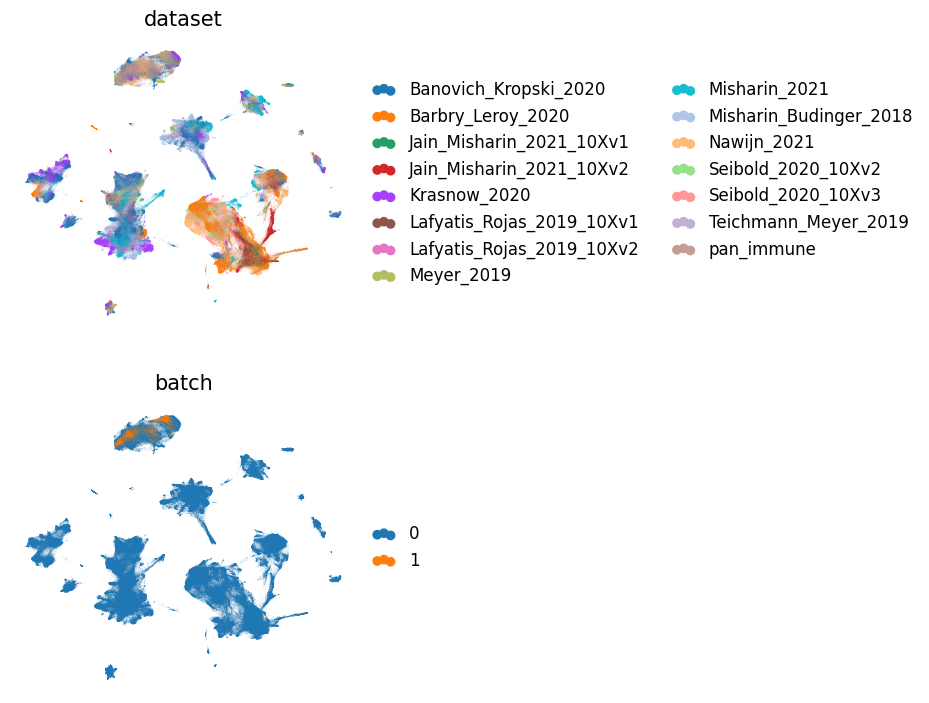

In [55]:
sc.pl.umap(
    combined_data,
    color=["dataset", "batch"],
    ncols=1,
    frameon=False,
)

Let's plot only batch. It is 1:1 equivalent with the dataset anyway as can be seen below.

In [56]:
idx1 = combined_data.obs["batch"] == "1"
idx2 = combined_data.obs["dataset"] == "pan_immune"
assert idx1.equals(idx2)

In [57]:
sc.set_figure_params(vector_friendly=True, dpi_save=300)

In [58]:
df = combined_data.obs
default_size = 120000 / len(df) # default scanpy
df["umap_size"] = default_size * 10
df.loc[df["batch"] == "1", "umap_size"] = default_size * 10 # if you want to make the query dataset points bigger
combined_data.obs = df

/home/cane/miniconda3/envs/resolvi/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


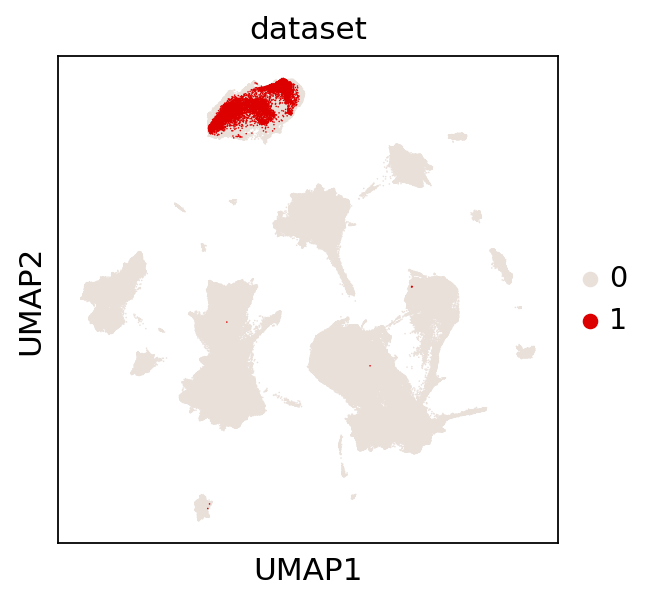

In [59]:
custom_pal = {"0": "#EAE0DA", "1": "#DC0000"}
sc.pl.umap(
    combined_data,
    color=["batch"],
    ncols=1,
    frameon=True,
    save="combined_umap_batch_panimmune.svg",
    palette=custom_pal,
    size=combined_data.obs["umap_size"],
    title="dataset"
)

In [60]:
combined_data.obs['Manually_curated_celltype'].value_counts()

NK_CD16+                   2771
Trm_Th1/Th17               1876
Teffector/EM_CD4            947
Tem/emra_CD8                945
NK_CD56bright_CD16-         462
Trm/em_CD8                  417
Tregs                       256
T_CD4/CD8                   248
Cycling T&NK                216
Tnaive/CM_CD4               176
Tgd_CRTAM+                  148
MAIT                        124
Trm_gut_CD8                  82
Tfh                          79
ILC3                         40
Tnaive/CM_CD8                39
Trm_Tgd                      17
Tnaive/CM_CD4_activated       9
Name: Manually_curated_celltype, dtype: int64

/home/cane/miniconda3/envs/resolvi/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


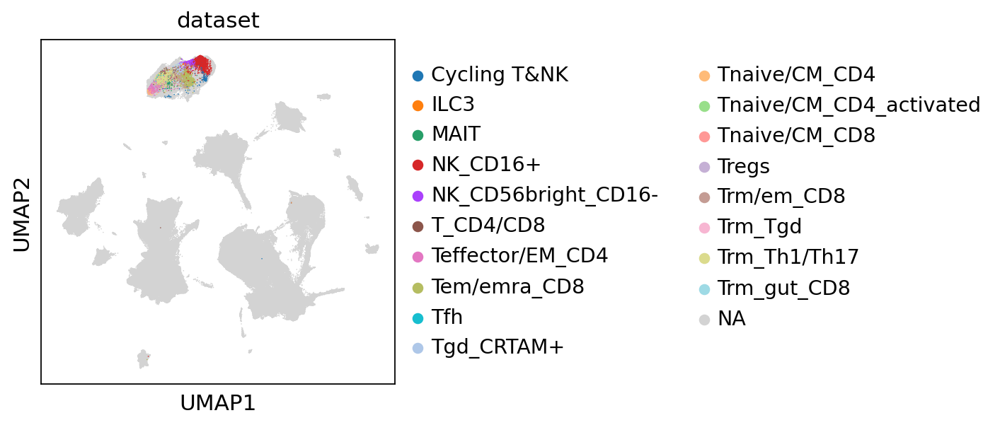

In [61]:
sc.pl.umap(
    combined_data,
    color=["Manually_curated_celltype"],
    ncols=1,
    frameon=True,
    save="combined_umap_celltype_panimmune.svg",
    size=combined_data.obs["umap_size"],
    title="dataset"
)

In [62]:
query = query_data.obsm['X_scanvi_emb']
query_nn_index = pynndescent.NNDescent(query)
query_nn_index.prepare()

## 8 Predict cell types

Let's predict using a different cell type than we did earlier, as that is too coarse grained (compartment-level resolution).

In [63]:
combined_neighbors, combined_distances = query_nn_index.query(combined_data.obsm['X_scanvi_emb'])

In [64]:
def distances_to_affinities(distances):
    # convert distances to affinities
    stds = np.std(distances, axis=1)
    stds = (2.0 / stds) ** 2
    stds = stds.reshape(-1, 1)
    distances_tilda = np.exp(-np.true_divide(distances, stds))
    weights = distances_tilda / np.sum(
        distances_tilda, axis=1, keepdims=True
    )
    return weights

# import numba
# @numba.njit
def weighted_prediction(weights, ref_cats):
    """Get highest weight category."""
    N = len(weights)
    predictions = np.zeros((N,), dtype=ref_cats.dtype)
    uncertainty = np.zeros((N,))
    for i in range(N):
        obs_weights = weights[i]
        obs_cats = ref_cats[i]
        best_prob = 0
        for c in np.unique(obs_cats):
            cand_prob = np.sum(obs_weights[obs_cats == c])
            if cand_prob > best_prob:
                best_prob = cand_prob
                predictions[i] = c
                uncertainty[i] = max(1 - best_prob, 0)

    return predictions, uncertainty

weights = distances_to_affinities(combined_distances)

### Predict

In [ ]:
label_key = "Manually_curated_celltype"
query_cats = query_data.obs[label_key].cat.codes.to_numpy()[combined_neighbors]
p, u = weighted_prediction(weights, query_cats)
p = np.asarray(query_data.obs[label_key].cat.categories)[p]
combined_data.obs["celltype_pred"], combined_data.obs["celltype_uncertainty"] = p, u

/home/cane/miniconda3/envs/resolvi/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


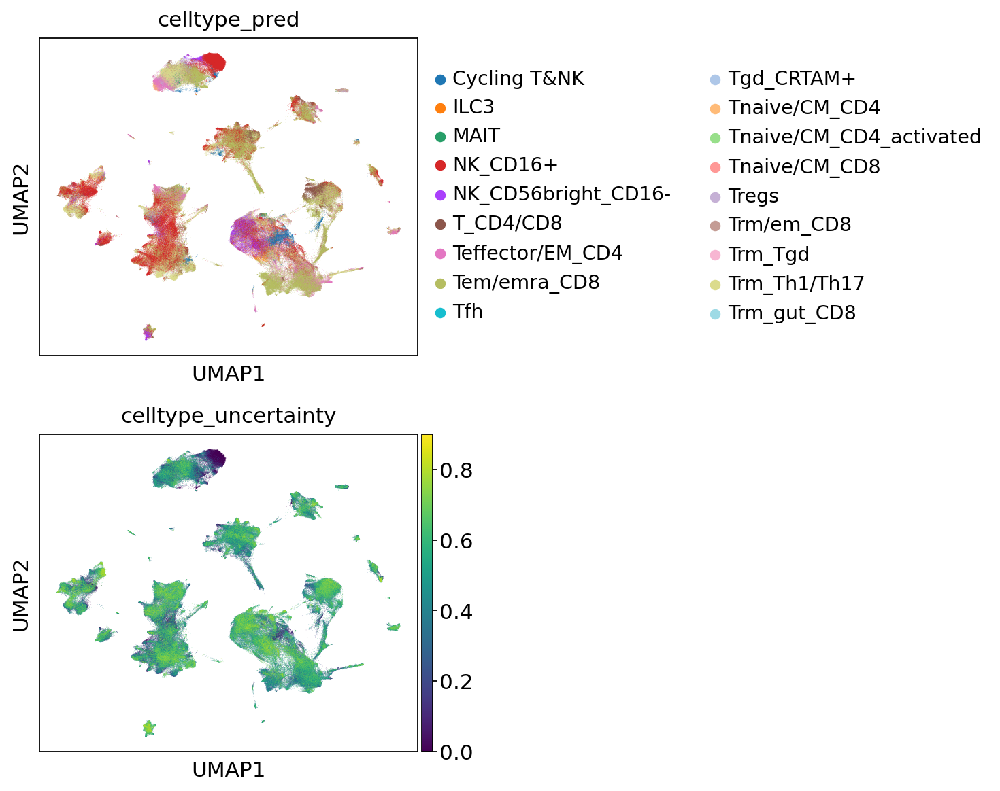

In [68]:
sc.pl.umap(
    combined_data,
    color=["celltype_pred", "celltype_uncertainty"],
    ncols=1,
    frameon=True,
    #save="combined_umap_celltype_panimmune.svg",
    #size=combined_data.obs["umap_size"],
    #title="dataset"
)

0.3791431155354163 0.599867045879364


<Axes: ylabel='Density'>

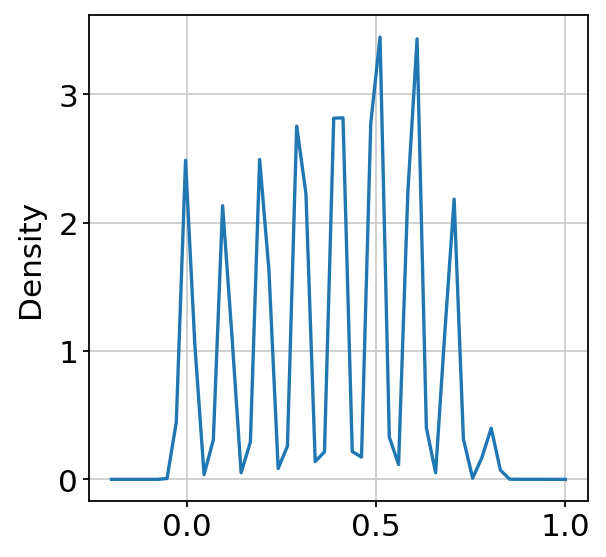

In [69]:
print(combined_data.obs["celltype_uncertainty"].mean(), np.quantile(combined_data.obs["celltype_uncertainty"], 0.75))
combined_data.obs["celltype_uncertainty"].plot(kind='density', ind=np.linspace(-0.2, 1))

In [73]:
query_combined = combined_data[combined_data.obs['batch'] == '1'].copy()

In [74]:
def get_comparison_df(uncertainty_threshold = None):
    # build comparison_df
    comparison_df = pd.DataFrame(index=query_combined.obs_names, columns=["pred", "ground_truth", "pred_uncertainty"])
    comparison_df["pred"] = query_combined.obs["celltype_pred"]
    comparison_df["pred_uncertainty"] = query_combined.obs["celltype_uncertainty"]
    comparison_df["ground_truth"] = query_combined.obs["Manually_curated_celltype"].fillna("Unknown")

    # we dont care about cases where we dont know the ground truth (in fact we could have skipped prediction for these altogether)
    n_before = len(comparison_df)
    comparison_df = comparison_df[comparison_df["ground_truth"] != "Unknown"]
    n_filtered = n_before-len(comparison_df)
    pct_filtered = 100*n_filtered/n_before
    print(f"filtered out {n_filtered} barcodes ({pct_filtered:.2f}%) with unknown ground truth")

    if uncertainty_threshold is not None:
        # filter out uncertainty > threshold
        n_before = len(comparison_df)
        comparison_df = comparison_df[comparison_df["pred_uncertainty"] <= uncertainty_threshold]
        n_filtered = n_before-len(comparison_df)
        pct_filtered = 100*n_filtered/n_before
        print(f"filtered out {n_filtered} barcodes ({pct_filtered:.2f}%) with pred uncertainty < {uncertainty_threshold}")

    return comparison_df

In [75]:
comparison_df = get_comparison_df(uncertainty_threshold=0.2)

filtered out 0 barcodes (0.00%) with unknown ground truth
filtered out 2559 barcodes (28.91%) with pred uncertainty < 0.2


In [79]:
query_data.obs['Manually_curated_celltype'].value_counts()

NK_CD16+                   2771
Trm_Th1/Th17               1876
Teffector/EM_CD4            947
Tem/emra_CD8                945
NK_CD56bright_CD16-         462
Trm/em_CD8                  417
Tregs                       256
T_CD4/CD8                   248
Cycling T&NK                216
Tnaive/CM_CD4               176
Tgd_CRTAM+                  148
MAIT                        124
Trm_gut_CD8                  82
Tfh                          79
ILC3                         40
Tnaive/CM_CD8                39
Trm_Tgd                      17
Tnaive/CM_CD4_activated       9
Name: Manually_curated_celltype, dtype: int64

In [77]:
comparison_df.groupby("pred")["pred_uncertainty"].mean()

pred
Cycling T&NK           0.035616
ILC3                        NaN
MAIT                   0.102293
NK_CD16+               0.014309
NK_CD56bright_CD16-    0.058239
T_CD4/CD8              0.122558
Teffector/EM_CD4       0.091383
Tem/emra_CD8           0.055312
Tfh                         NaN
Tgd_CRTAM+             0.126792
Tnaive/CM_CD4          0.141865
Tnaive/CM_CD8          0.165565
Tregs                  0.051332
Trm/em_CD8             0.107425
Trm_Tgd                     NaN
Trm_Th1/Th17           0.050943
Trm_gut_CD8                 NaN
Name: pred_uncertainty, dtype: float64

Some notes on the new HLCA annotations (https://zenodo.org/record/6337966/ vs https://zenodo.org/record/7599104):
- All new 60 cells have None for ann_level_3 annotations.
- No cells was predicted as "Smooth muscle FAM83D+" (even before thresholding on prediction uncertainty)
- In prev ann_level_3, not in new: 'Fibromyocytes'
- In new ann_level_3, not in prev: 'Smooth muscle FAM83D+'
- Only 565 cells differ between prev and new ann_level_3 annotations and their distribution is (prev, new):  
Fibromyocytes,Smooth muscle FAM83D+   -> 335  
Secretory,AT2                       ->   230

In [80]:
# https://docs.scvi-tools.org/en/stable/tutorials/notebooks/cellassign_tutorial.html#Model-reproducibility
confusion_matrix = pd.crosstab(
    comparison_df["pred"],
    comparison_df["ground_truth"], 
    rownames=["Predicted label"],
    colnames=["True label"],
)
confusion_matrix /= confusion_matrix.sum(1).ravel().reshape(-1, 1)
confusion_matrix *= 100

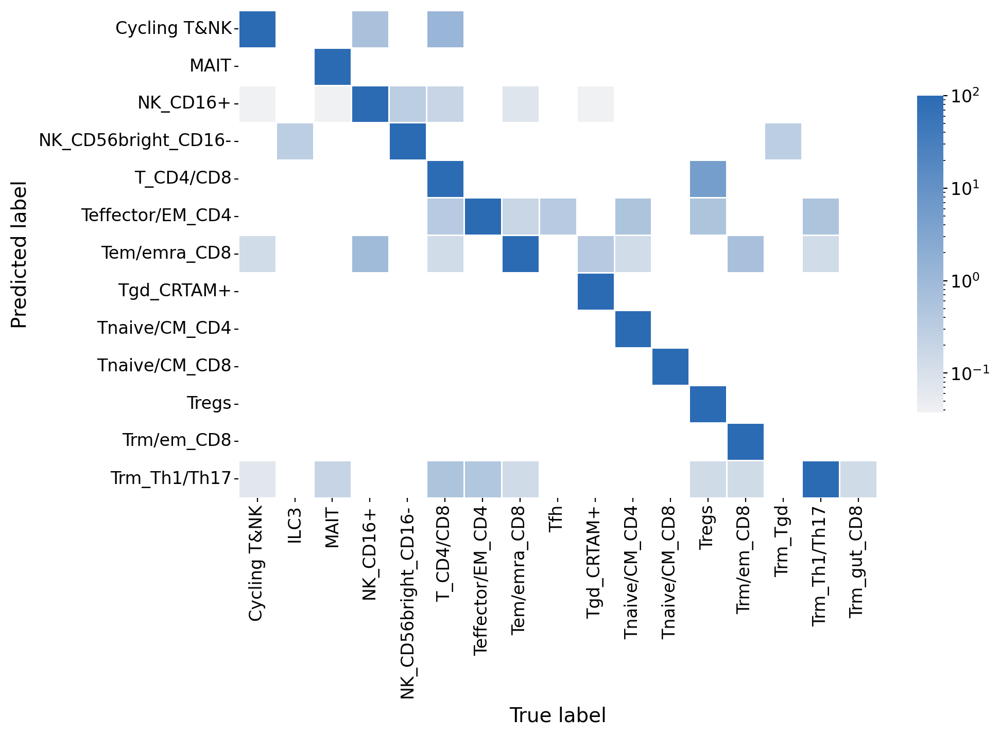

In [87]:
from matplotlib.colors import LogNorm, Normalize

fig, ax = plt.subplots(figsize=(10, 10))
sns.heatmap(
    confusion_matrix,
    # cmap=sns.diverging_palette(245, 320, s=60, as_cmap=True),
    cmap=sns.color_palette("light:#2b6bb4", as_cmap=True),
    ax=ax,
    square=True,
    fmt=".2f",
    cbar_kws=dict(shrink=0.4, aspect=12),
    linecolor='white',
    linewidths=1, 
    # annot=True,
    norm=LogNorm()
)
plt.savefig('confusion_matrix.png', dpi=300)
plt.show()

In [100]:
combined_data.obs['ann_level_3'].value_counts()

Macrophages                     111844
Basal                            84713
Secretory                        80327
AT2                              62405
T cell lineage                   50859
Multiciliated lineage            41098
Monocytes                        26529
EC capillary                     23205
Fibroblasts                      20384
Innate lymphoid cell NK          16978
EC venous                        12975
Dendritic cells                  10319
AT1                               7937
EC arterial                       7391
Mast cells                        6623
B cell lineage                    6284
Submucosal Secretory              4700
Lymphatic EC mature               4001
None                              3286
Rare                               885
Myofibroblasts                     716
Lymphatic EC differentiating       566
SM activated stress response       556
Smooth muscle FAM83D+              335
Lymphatic EC proliferating          28
Name: ann_level_3, dtype:

In [125]:
ref_tcell = combined_data[np.logical_or(combined_data.obs['ann_level_3'].isin(['T cell lineage', 'Innate lymphoid cell NK']), combined_data.obs['batch']=='1')]

/home/cane/miniconda3/envs/resolvi/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/cane/miniconda3/envs/resolvi/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/cane/miniconda3/envs/resolvi/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/cane/miniconda3/envs/resolvi/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


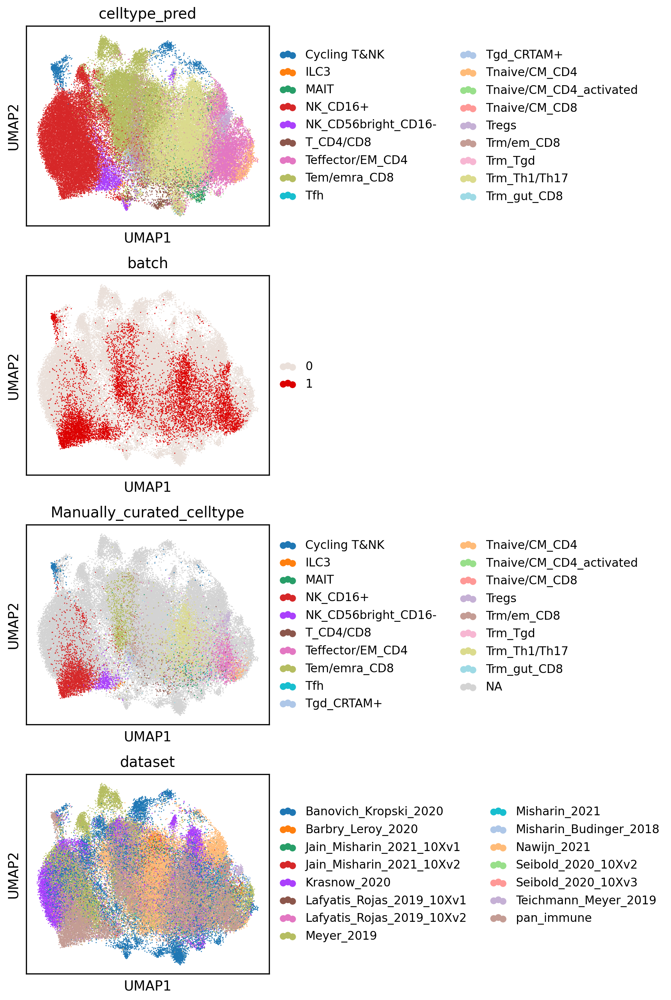

In [325]:
sc.tl.umap(ref_tcell)
sc.pl.umap(ref_tcell, color=['celltype_pred', 'batch', 'Manually_curated_celltype', 'dataset'], ncols=1, size=5)#, save='_predicted_tcells.svg')

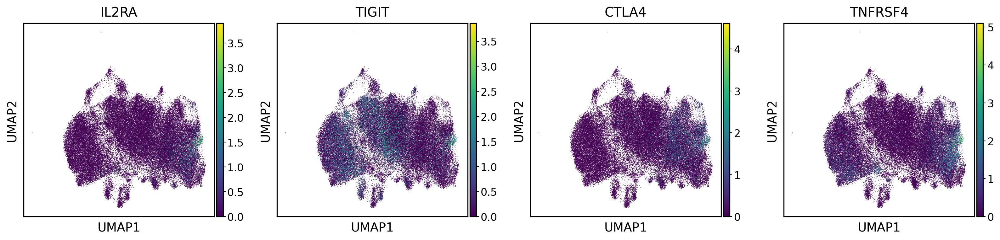

In [129]:
sc.pl.umap(ref_tcell, color=['IL2RA', 'TIGIT', 'CTLA4', 'TNFRSF4'], gene_symbols='feature_name-0', save='_predicted_treg_markers.svg')

In [130]:
ref_tregs = combined_data[np.logical_and(combined_data.obs['ann_level_3'].isin(['T cell lineage', 'Innate lymphoid cell NK']), combined_data.obs['celltype_pred']=='Tregs')]

In [133]:
adata.obs

,suspension_type,donor_id,is_primary_data,assay_ontology_term_id,cell_type_ontology_term_id,development_stage_ontology_term_id,disease_ontology_term_id,self_reported_ethnicity_ontology_term_id,tissue_ontology_term_id,organism_ontology_term_id,...,tissue_level_3,tissue_sampling_method,cell_type,assay,disease,organism,sex,tissue,self_reported_ethnicity,development_stage
GCGACCATCCCTAACC_SC22,cell,homosapiens_None_2023_None_sikkemalisa_001_d10...,False,EFO:0009899,CL:0000583,HsapDv:0000143,PATO:0000461,HANCESTRO:0005,UBERON:0008946,NCBITaxon:9606,...,NaN,donor_lung,alveolar macrophage,10x 3' v2,normal,Homo sapiens,female,lung parenchyma,European,49-year-old human stage
P2_1_GCGCAACCAGTTAACC,cell,homosapiens_None_2023_None_sikkemalisa_001_d10...,False,EFO:0009899,CL:0000623,HsapDv:0000140,PATO:0000461,HANCESTRO:0005,UBERON:0008946,NCBITaxon:9606,...,NaN,surgical_resection,natural killer cell,10x 3' v2,normal,Homo sapiens,male,lung parenchyma,European,46-year-old human stage
GCTCTGTAGTGCTGCC_SC27,cell,homosapiens_None_2023_None_sikkemalisa_001_d10...,False,EFO:0009899,CL:0002063,HsapDv:0000141,PATO:0000461,HANCESTRO:0005,UBERON:0008946,NCBITaxon:9606,...,NaN,donor_lung,type II pneumocyte,10x 3' v2,normal,Homo sapiens,female,lung parenchyma,European,47-year-old human stage
P2_8_TTAGGACGTTCAGGCC,cell,homosapiens_None_2023_None_sikkemalisa_001_d10...,False,EFO:0009899,CL:0000583,HsapDv:0000140,PATO:0000461,HANCESTRO:0005,UBERON:0001005,NCBITaxon:9606,...,distal airways middle right lobe,surgical_resection,alveolar macrophage,10x 3' v2,normal,Homo sapiens,male,respiratory airway,European,46-year-old human stage
CTTGATTGTCAGTTTG_T164,cell,homosapiens_None_2023_None_sikkemalisa_001_d10...,False,EFO:0009922,CL:0002633,HsapDv:0000160,PATO:0000461,HANCESTRO:0005,UBERON:0001005,NCBITaxon:9606,...,NaN,donor_lung,respiratory basal cell,10x 3' v3,normal,Homo sapiens,male,respiratory airway,European,66-year-old human stage
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ACCTTTACATTAACCG_T120,cell,homosapiens_None_2023_None_sikkemalisa_001_d10...,False,EFO:0009899,CL:0002633,HsapDv:0000151,PATO:0000461,HANCESTRO:0005,UBERON:0001005,NCBITaxon:9606,...,NaN,donor_lung,respiratory basal cell,10x 3' v2,normal,Homo sapiens,female,respiratory airway,European,57-year-old human stage
CATTATCTCCATGAAC_F01639,cell,homosapiens_None_2023_None_sikkemalisa_001_d10...,False,EFO:0011025,CL:0002399,HsapDv:0000147,PATO:0000461,HANCESTRO:0005,UBERON:0008946,NCBITaxon:9606,...,NaN,donor_lung,CD1c-positive myeloid dendritic cell,10x 5' v1,normal,Homo sapiens,male,lung parenchyma,European,53-year-old human stage
AGGCCGTGTGTGACCC-SC56,cell,homosapiens_None_2023_None_sikkemalisa_001_d10...,False,EFO:0009899,CL:0002063,HsapDv:0000151,PATO:0000461,HANCESTRO:0005,UBERON:0008946,NCBITaxon:9606,...,NaN,donor_lung,type II pneumocyte,10x 3' v2,normal,Homo sapiens,female,lung parenchyma,European,57-year-old human stage
CGATGGCAGCAGGCTA-1-2,cell,homosapiens_None_2023_None_sikkemalisa_001_d10...,False,EFO:0011025,CL:0000158,HsapDv:0000135,PATO:0000461,HANCESTRO:0005,UBERON:0000004,NCBITaxon:9606,...,inferior turbinate right nostril,scraping,club cell,10x 5' v1,normal,Homo sapiens,male,nose,European,41-year-old human stage


In [135]:
ref_tregs.obs[['tissue', 'sex']].value_counts()

tissue              sex   
lung parenchyma     male      224
                    female    190
respiratory airway  male       93
                    female     66
nose                male       30
                    female      3
dtype: int64

In [144]:
ref_tregs.obs_names

Index(['CTAATGGAGTGGGATC_HD67-0', 'GACACGCCACCATCCT_F02522-0',
       'P3_7_AGTGAGGTCGTTACAG-0', 'GAAACTCCACGACTCG-1-HCATisStab7587202-0',
       'CGATGTAAGGAGTACC_SC24-0', 'CTGCCTATCAGGTAAA_F02526-0',
       'GTCGGGTTCTTATCTG_SC24-0', 'ACGGGTCCAGGTTTCA_GRO-04_biopsy-0',
       'ATCCGAAGTTACGACT_GRO-07_biopsy-0', 'AATTCCTAGCATCGAG_SC84-0',
       ...
       'CATGCCTAGGGCTAAC_SC84-0', 'GATCGTAAGGACACCA-1-HCATisStab7747197-0',
       'ACATTTCTCCGGCAAC_SC87-0', 'GTAGGTTGTGCTCCGA_SC84-0',
       'CTGCTGTCAAGAGGCT_GRO-09_biopsy-0', 'ACGGAGACAAATTGCC-SC59-0',
       'ACGTGCTCACTTACT_GRO-08_biopsy-0', 'CAGCATACACGAAATA_GRO-09_biopsy-0',
       'TACAACGTCAGCATTG_SC84-0', 'D344_Brus_Dis1_GATGCTAAGTACGCCC-1-14-0'],
      dtype='object', length=606)

In [230]:
#adata_url = "https://cellxgene.cziscience.com/e/066943a2-fdac-4b29-b348-40cede398e4e.cxg/"
#b = cellxgene(adata_url, filename="adata.h5ad", save_path=local_dir)
raw_tregs = b[[i[:-2] for i in ref_tregs.obs_names]].copy()

In [231]:
raw_tregs.X = raw_tregs.raw.X

In [232]:
raw_tregs.var_names = raw_tregs.var['feature_name'].astype(str)

In [233]:
import decoupler as dc

# Get pseudo-bulk profile
pdata = dc.get_pseudobulk(
    raw_tregs,
    sample_col='donor_id',
    groups_col=None,
    mode='sum',
    min_cells=10,
    min_counts=1000,
)
pdata

AnnData object with n_obs × n_vars = 15 × 15339
    obs: 'suspension_type', 'donor_id', 'is_primary_data', 'assay_ontology_term_id', 'development_stage_ontology_term_id', 'disease_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'organism_ontology_term_id', 'sex_ontology_term_id', 'BMI', 'age_or_mean_of_age_range', 'age_range', 'ann_coarse_for_GWAS_and_modeling', 'ann_level_1', 'ann_level_2', 'ann_level_3', 'ann_level_5', 'cause_of_death', 'dataset', 'fresh_or_frozen', 'leiden_1', 'leiden_2', 'leiden_5', 'lung_condition', 'mixed_ancestry', 'reference_genome', 'sequencing_platform', 'smoking_status', 'study', 'subject_type', 'tissue_dissociation_protocol', 'assay', 'disease', 'organism', 'sex', 'self_reported_ethnicity', 'development_stage', 'psbulk_n_cells', 'psbulk_counts'
    var: 'feature_is_filtered', 'feature_name', 'feature_reference', 'feature_biotype'
    layers: 'psbulk_props'

/home/cane/miniconda3/envs/resolvi/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/cane/miniconda3/envs/resolvi/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/cane/miniconda3/envs/resolvi/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


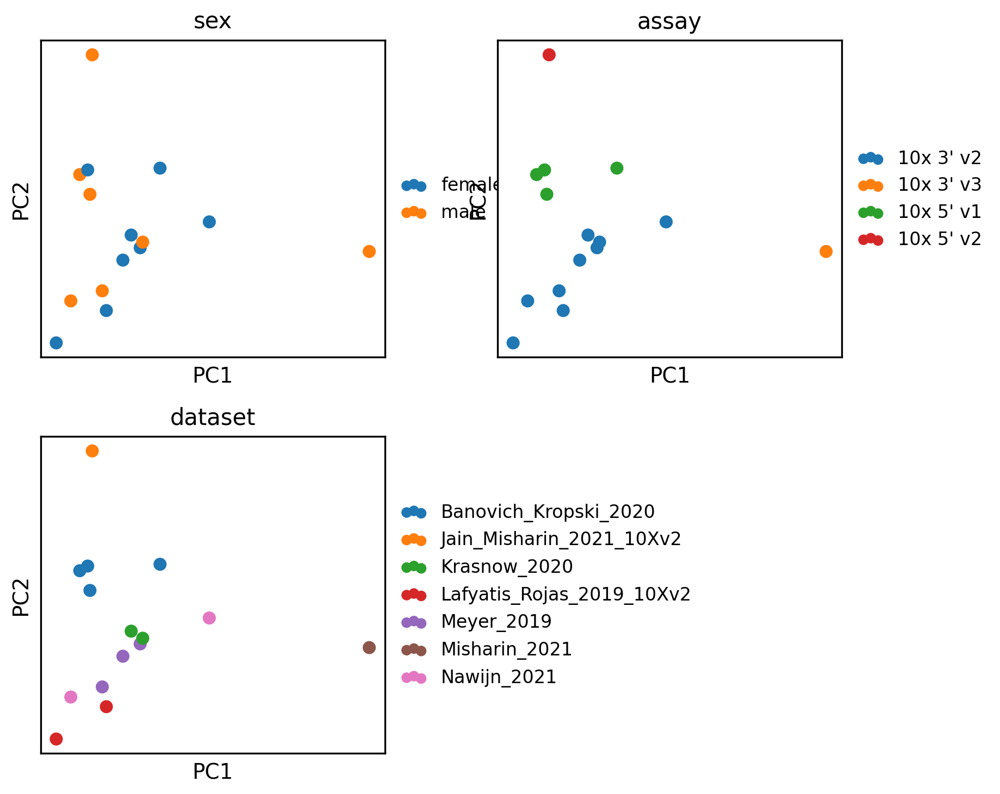

In [234]:
pp_pdata = pdata.copy()
sc.pp.normalize_total(pp_pdata, target_sum=1e6)
sc.pp.log1p(pp_pdata)
sc.pp.scale(pp_pdata, max_value=10)
sc.tl.pca(pp_pdata, n_comps=10)
sc.pl.pca(pp_pdata, color=['sex', 'assay', 'dataset'], ncols=2, show=True, size=300)

In [309]:
# Obtain genes that pass the thresholds
genes = dc.filter_by_expr(pdata, group='sex', min_count=2, min_total_count=15)

# Filter by these genes
pdatas = pdata[:, genes].copy()
pdatas, pdatas[:, 'XIST']

(AnnData object with n_obs × n_vars = 15 × 4103
     obs: 'suspension_type', 'donor_id', 'is_primary_data', 'assay_ontology_term_id', 'development_stage_ontology_term_id', 'disease_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'organism_ontology_term_id', 'sex_ontology_term_id', 'BMI', 'age_or_mean_of_age_range', 'age_range', 'ann_coarse_for_GWAS_and_modeling', 'ann_level_1', 'ann_level_2', 'ann_level_3', 'ann_level_5', 'cause_of_death', 'dataset', 'fresh_or_frozen', 'leiden_1', 'leiden_2', 'leiden_5', 'lung_condition', 'mixed_ancestry', 'reference_genome', 'sequencing_platform', 'smoking_status', 'study', 'subject_type', 'tissue_dissociation_protocol', 'assay', 'disease', 'organism', 'sex', 'self_reported_ethnicity', 'development_stage', 'psbulk_n_cells', 'psbulk_counts'
     var: 'feature_is_filtered', 'feature_name', 'feature_reference', 'feature_biotype'
     uns: 'trend_coeffs', '_squared_logres', 'prior_disp_var'
     obsm: 'design_matrix', 'size_factors', 'repla

In [310]:
# Import DESeq2
from pydeseq2.dds import DeseqDataSet
from pydeseq2.ds import DeseqStats

In [317]:
# Build DESeq2 object
dds = DeseqDataSet(
    adata=pdatas,
    design_factors=['sex', 'dataset'],
    ref_level=['sex', 'female'],
    refit_cooks=True,
    n_cpus=8,
)

In [318]:
# Compute LFCs
dds.deseq2()

Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 2.51 seconds.

Fitting dispersion trend curve...
... done in 1.02 seconds.

Fitting MAP dispersions...
... done in 1.85 seconds.

Fitting LFCs...
... done in 0.38 seconds.

Refitting 703 outliers.

Fitting dispersions...
... done in 0.10 seconds.

Fitting MAP dispersions...
... done in 0.12 seconds.

Fitting LFCs...
... done in 0.12 seconds.



In [319]:
stat_res = DeseqStats(dds, contrast=["sex", 'female', 'male'], n_cpus=8)

In [320]:
stat_res.summary()

Running Wald tests...


Log2 fold change & Wald test p-value: sex female vs male


... done in 0.32 seconds.



,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
feature_name,,,,,,
A1BG,4.664206,-0.765149,0.791361,-0.966877,0.333605,0.999482
AAK1,7.546614,0.130232,0.427123,0.304904,0.760439,0.999482
AAMP,3.438326,0.166568,0.505374,0.329593,0.741708,0.999482
AASDHPPT,2.695241,-0.207559,0.720800,-0.287956,0.773381,0.999482
AATF,4.408285,0.796935,0.610666,1.305027,0.191884,0.999482
...,...,...,...,...,...,...
ZNRF1,3.242543,-0.644659,0.789576,-0.816462,0.414236,0.999482
ZPR1,3.275877,0.071357,0.537710,0.132706,0.894426,0.999482
ZRANB2,3.710205,0.281957,0.618159,0.456124,0.648301,0.999482


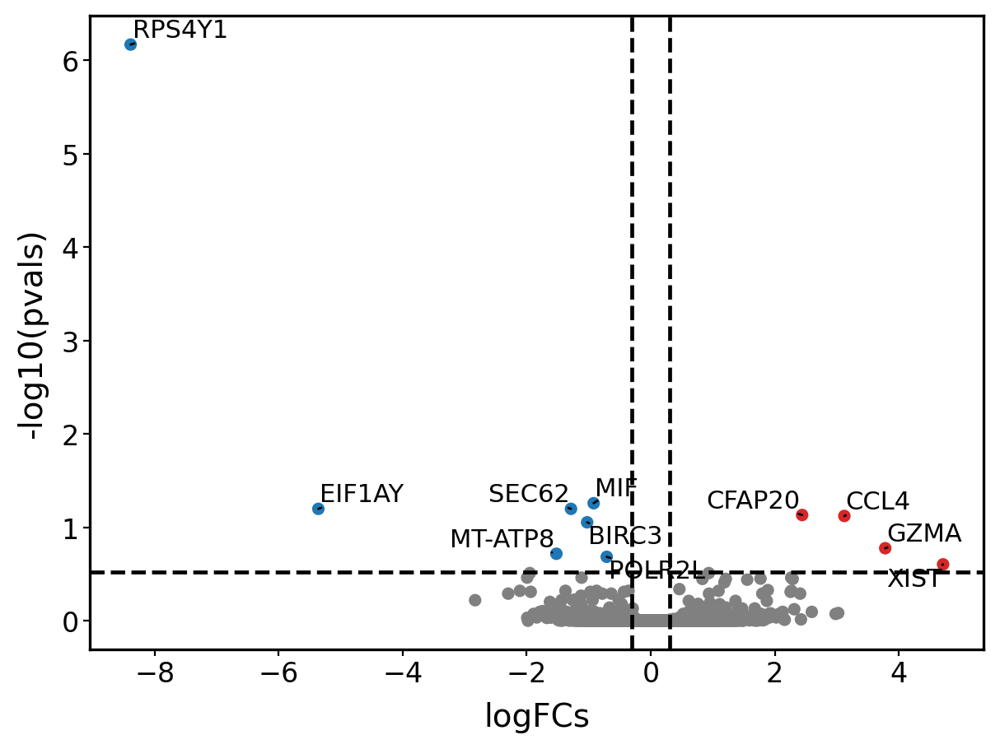

In [327]:
results_df = stat_res.results_df
dc.plot_volcano_df(results_df, x='log2FoldChange', y='padj', top=20, sign_thr=0.3, lFCs_thr=0.3, lFCs_limit=12)
plt.savefig('treg_pseudobulk_sex.svg')
plt.show()

# Benchmark using wrong model

In [53]:
from scvi.data import cellxgene

local_dir = "/home/cane/Documents/yoseflab/can/scvi-hub"
adata_url = "https://cellxgene.cziscience.com/e/97a17473-e2b1-4f31-a544-44a60773e2dd.cxg/"
query_data = cellxgene(adata_url, filename="ts_epithelial.h5ad", save_path=local_dir)

In [54]:
query_data.X = query_data.raw[:, query_data.var_names].X.toarray()

In [55]:
import scvi
from scvi.criticism import PosteriorPredictiveCheck as PPC

In [57]:
# add dataset information:
query_data.obs['dataset'] = query_data.obs['tissue']

In [64]:
scvi.model.SCANVI.prepare_query_anndata(query_data, local_dir)
query_data.obs["scanvi_label"] = "unlabeled"

INFO     File /home/cane/Documents/yoseflab/can/scvi-hub/model.pt already downloaded                               
INFO     Found 100.0% reference vars in query data.                                                                


## Build a query model

Use `prepare_query_anndata` to re-order the genes and pad any missing genes with 0s, so that query_adata matches exactly the reference in terms of its gene set.  

In [11]:
query_model = scvi.model.SCANVI.load_query_data(query_data, local_dir, accelerator = "cpu")

INFO     File /home/cane/Documents/yoseflab/can/scvi-hub/model.pt already downloaded                               


/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/abc.py:119: FutureWarning: SparseDataset is deprecated and will be removed in late 2024. It has been replaced by the public classes CSRDataset and CSCDataset.

For instance checks, use `isinstance(X, (anndata.experimental.CSRDataset, anndata.experimental.CSCDataset))` instead.

For creation, use `anndata.experimental.sparse_dataset(X)` instead.

  return _abc_instancecheck(cls, instance)
An NVIDIA GPU may be present on this machine, but a CUDA-enabled jaxlib is not installed. Falling back to cpu.


In [12]:
query_model.adata

AnnData object with n_obs × n_vars = 104148 × 2000
    obs: 'tissue_in_publication', 'assay_ontology_term_id', 'donor_id', 'anatomical_information', 'n_counts_UMIs', 'n_genes', 'cell_ontology_class', 'free_annotation', 'manually_annotated', 'compartment', 'sex_ontology_term_id', 'disease_ontology_term_id', 'is_primary_data', 'organism_ontology_term_id', 'suspension_type', 'cell_type_ontology_term_id', 'tissue_ontology_term_id', 'development_stage_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'cell_type', 'assay', 'disease', 'organism', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'dataset', 'scanvi_label', '_scvi_batch', '_scvi_labels'
    var: 'feature_type', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std', 'feature_is_filtered', 'feature_name', 'feature_reference', 'feature_biotype'
    uns: '_scvi_uuid', '_scvi_manager_uuid'
    obsm: 'X_pca', 'X_scvi', 'X_scvi_umap', 'X_umap'
    obsp: 'connectivities', 'distances'

Train the query model.

In [13]:
surgery_epochs = 500
train_kwargs_surgery = {
    "early_stopping": True,
    "early_stopping_monitor": "elbo_train",
    "early_stopping_patience": 10,
    "early_stopping_min_delta": 0.001,
    "plan_kwargs": {"weight_decay": 0.0},
}

In [14]:
query_model.train(
    max_epochs=surgery_epochs,
    accelerator="gpu",
    **train_kwargs_surgery,
)

INFO     Training for 500 epochs.                                                                                  


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
You are using a CUDA device ('NVIDIA GeForce RTX 3090') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 1/500:   0%|          | 0/500 [00:00<?, ?it/s]

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/abc.py:119: FutureWarning: SparseDataset is deprecated and will be removed in late 2024. It has been replaced by the public classes CSRDataset and CSCDataset.

For instance checks, use `isinstance(X, (anndata.experimental.CSRDataset, anndata.experimental.CSCDataset))` instead.

For creation, use `anndata.experimental.sparse_dataset(X)` instead.

  return _abc_instancecheck(cls, instance)


Epoch 301/500:  60%|██████    | 301/500 [20:11<13:21,  4.03s/it, v_num=1, train_loss_step=1.19e+3, train_loss_epoch=1.31e+3]
Monitored metric elbo_train did not improve in the last 10 records. Best score: 1332.213. Signaling Trainer to stop.


In [15]:
query_save_path = f"{local_dir}/query_model_ts_epithelial"
query_model.save(query_save_path, overwrite=True)

In [93]:
query_save_path = f"{local_dir}/query_model_ts_epithelial"
query_model = scvi.model.SCANVI.load(query_save_path, adata=query_data)

INFO     File /home/cane/Documents/yoseflab/can/scvi-hub/query_model_ts_epithelial/model.pt already downloaded     


In [94]:
query_data.obsm['X_scanvi_emb'] = query_model.get_latent_representation()

In [96]:
import scvi.criticism as criticism
from ppc_plot_utils import PPCPlot

In [97]:
temp_fig_dir = "/home/cane/Documents/yoseflab/can/scvi-hub/scvi-hub-reproducibility/figures_query/"

In [99]:
# marginal_ll = []
# for i in range(query_data.n_obs):
#    marginal_ll.append(query_model.get_marginal_ll(indices=[i]))

In [100]:
query_model.adata.obs['tissue'].unique()

['liver', 'trachea', 'parotid gland', 'anterior part of tongue', 'posterior part of tongue', ..., 'lung', 'small intestine', 'kidney', 'endocrine pancreas', 'aorta']
Length: 32
Categories (32, object): ['endocrine pancreas', 'exocrine pancreas', 'large intestine', 'aorta', ..., 'retinal neural layer', 'anterior part of tongue', 'posterior part of tongue', 'bladder organ']

In [92]:
import copy

ScanVI Model with the following params: 
unlabeled_category: unlabeled, n_hidden: 128, n_latent: 30, n_layers: 2, dropout_rate: 0.1, dispersion: gene, 
gene_likelihood: nb
Training status: Trained
Model's adata is minified?: False

In [ ]:
ppc = {}
for tissue in query_model.adata.obs['tissue'].unique():
    print(tissue)
    q_model = copy.deepcopy(query_model)
    q_model.adata = q_model.adata[q_model.adata.obs['tissue']==tissue].copy()
    ppc[tissue] = PPC(q_model.adata, {"SCANVI": q_model}, n_samples=10)
    ppc[tissue] = criticism.PosteriorPredictiveCheck(q_model.adata, {"SCANVI": q_model})
    # expected runtime ~8min
    ppc[tissue].coefficient_of_variation("features")

    ppc_plt = PPCPlot(ppc[tissue])
    ppc_plt.plot_cv(model_name="SCANVI", cell_wise=True, plt_type="hist2d")

    fig_path = f'{temp_fig_dir}/ppc_cv_cell_ts_query_{tissue}.svg'
    plt.savefig(fig_path, dpi=600, bbox_inches="tight")
    plt.title(tissue)
    plt.show()

In [111]:
len(ppc)

32

In [112]:
ppc_plt.plot_cv?

Signature:
ppc_plt.plot_cv(
    model_name: str,
    cell_wise: bool = True,
    plt_type: Literal['scatter', 'hist2d'] = 'hist2d',
)
Docstring:
Plot coefficient of variation metrics results.

See our tutorials for a demonstration of the generated plot along with detailed explanations.

Parameters
----------
model_name
    Name of the model
cell_wise
    Whether to plot the cell-wise or gene-wise metric
plt_type
    The type of plot to generate.
File:      ~/Documents/yoseflab/can/scvi-hub/scvi-hub-reproducibility/ppc_plot_utils.py
Type:      method

In [ ]:
fig, ax = plt.subplots(8, 4, figsize=(20, 10))

for tissue in enumerate(query_model.adata.obs['tissue'].unique()):
    ppc_plt = PPCPlot(ppc[tissue])
    ppc_plt.plot_cv(model_name="SCANVI", cell_wise=True, plt_type="hist2d")

    plt.title(tissue)
    plt.show()
fig_path = f'{temp_fig_dir}/ppc_cv_cell_ts_query_all_tissues.svg'

model=SCANVI | metric=cv_cell | n_cells=1600:
Mean Absolute Error=1.78,
Pearson correlation=0.78
Spearman correlation=0.77
r^2=0.38



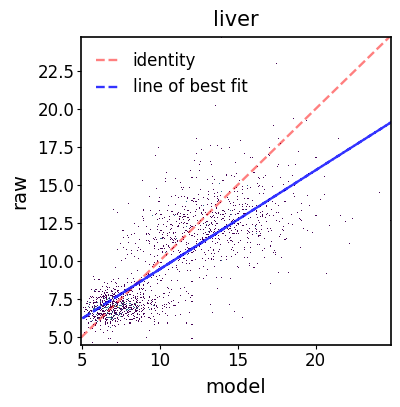

model=SCANVI | metric=cv_cell | n_cells=5047:
Mean Absolute Error=1.26,
Pearson correlation=0.78
Spearman correlation=0.80
r^2=0.61



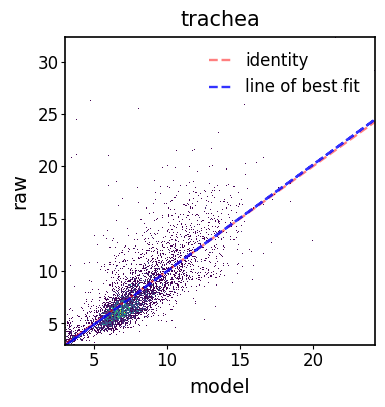

model=SCANVI | metric=cv_cell | n_cells=8932:
Mean Absolute Error=2.89,
Pearson correlation=0.30
Spearman correlation=0.14
r^2=-0.49



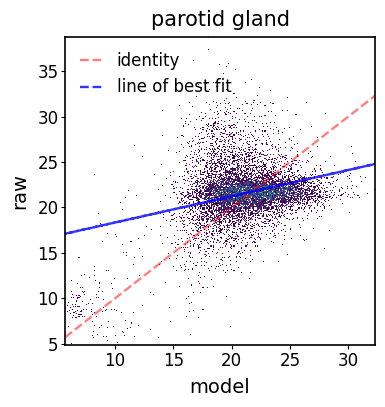

model=SCANVI | metric=cv_cell | n_cells=4498:
Mean Absolute Error=2.86,
Pearson correlation=0.18
Spearman correlation=0.15
r^2=-0.86



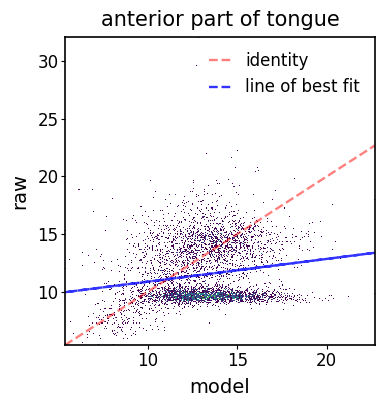

model=SCANVI | metric=cv_cell | n_cells=7395:
Mean Absolute Error=1.84,
Pearson correlation=0.71
Spearman correlation=0.74
r^2=0.36



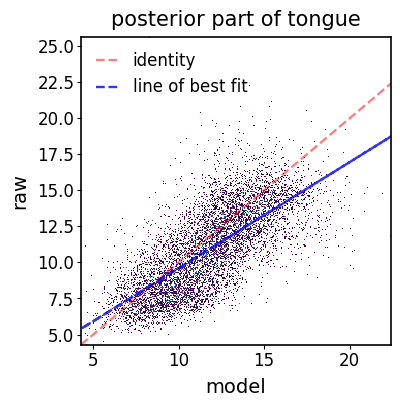

model=SCANVI | metric=cv_cell | n_cells=5854:
Mean Absolute Error=3.13,
Pearson correlation=0.40
Spearman correlation=0.47
r^2=-0.50



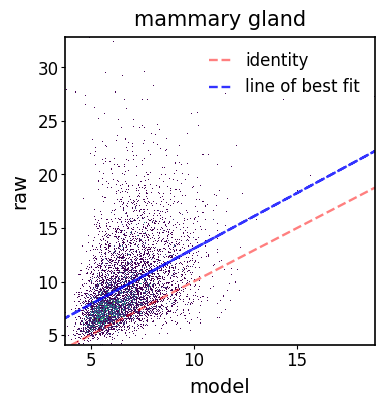

model=SCANVI | metric=cv_cell | n_cells=230:
Mean Absolute Error=1.09,
Pearson correlation=0.25
Spearman correlation=0.37
r^2=-0.50



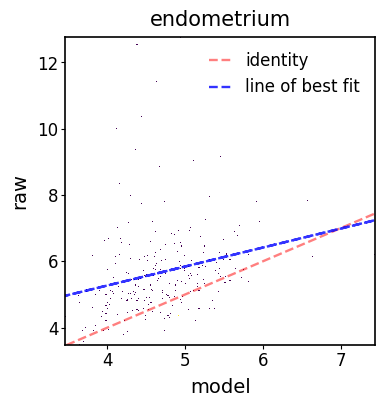

model=SCANVI | metric=cv_cell | n_cells=9:
Mean Absolute Error=2.05,
Pearson correlation=-0.36
Spearman correlation=-0.40
r^2=-0.53



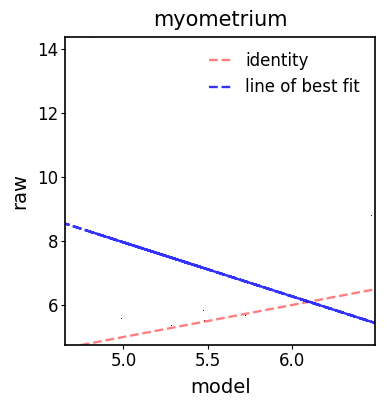

model=SCANVI | metric=cv_cell | n_cells=2052:
Mean Absolute Error=2.32,
Pearson correlation=0.22
Spearman correlation=0.16
r^2=-0.89



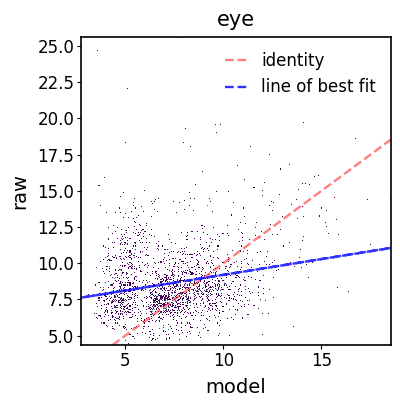

model=SCANVI | metric=cv_cell | n_cells=2084:
Mean Absolute Error=0.61,
Pearson correlation=0.33
Spearman correlation=0.35
r^2=-0.10



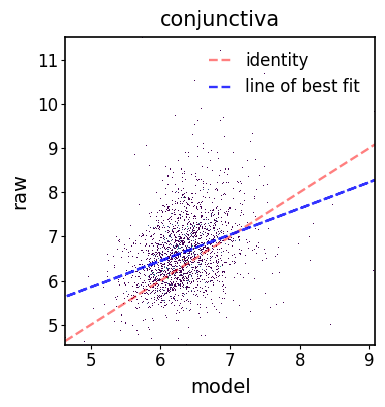

model=SCANVI | metric=cv_cell | n_cells=59:
Mean Absolute Error=4.72,
Pearson correlation=0.03
Spearman correlation=0.09
r^2=-1.32



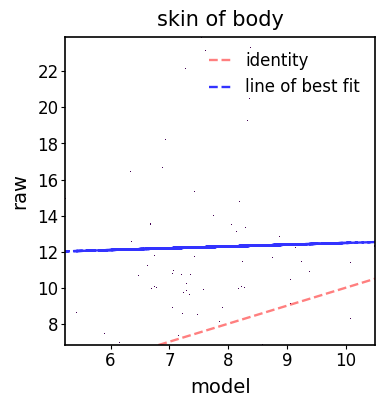

model=SCANVI | metric=cv_cell | n_cells=787:
Mean Absolute Error=3.65,
Pearson correlation=0.23
Spearman correlation=0.19
r^2=-0.94



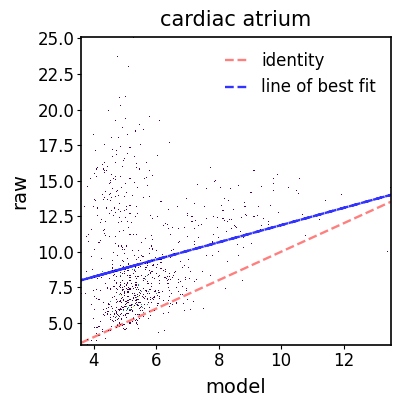

model=SCANVI | metric=cv_cell | n_cells=302:
Mean Absolute Error=3.81,
Pearson correlation=-0.03
Spearman correlation=-0.01
r^2=-1.20



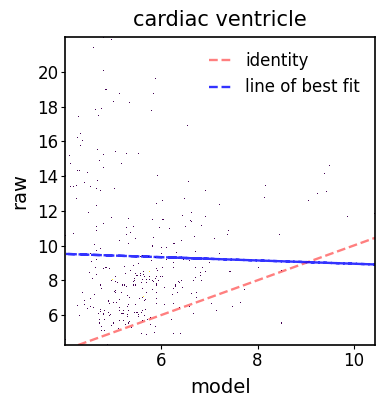

model=SCANVI | metric=cv_cell | n_cells=7128:
Mean Absolute Error=7.62,
Pearson correlation=0.61
Spearman correlation=0.67
r^2=-0.75



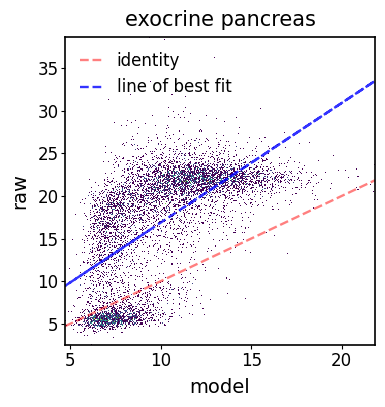

model=SCANVI | metric=cv_cell | n_cells=12316:
Mean Absolute Error=3.56,
Pearson correlation=0.39
Spearman correlation=0.40
r^2=-0.45



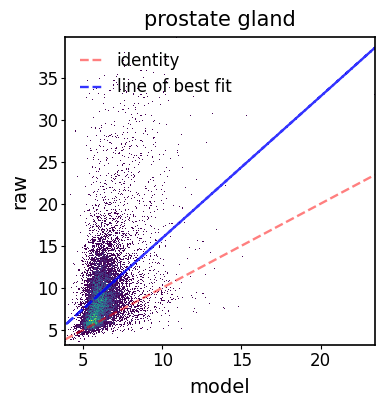

model=SCANVI | metric=cv_cell | n_cells=9:
Mean Absolute Error=3.80,
Pearson correlation=0.35
Spearman correlation=0.08
r^2=-2.78



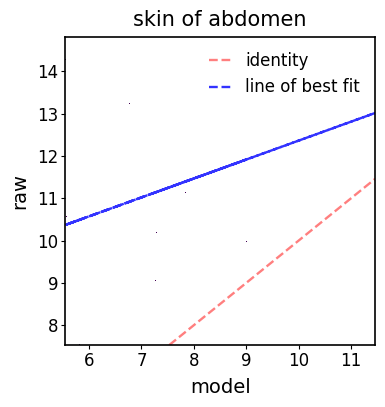

model=SCANVI | metric=cv_cell | n_cells=38:
Mean Absolute Error=6.73,
Pearson correlation=0.04
Spearman correlation=0.06
r^2=-1.93



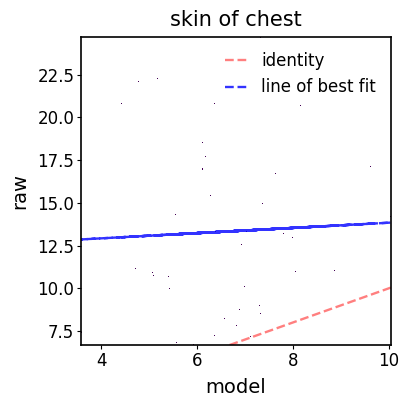

model=SCANVI | metric=cv_cell | n_cells=5:
Mean Absolute Error=12.79,
Pearson correlation=-0.63
Spearman correlation=-0.50
r^2=-12.44



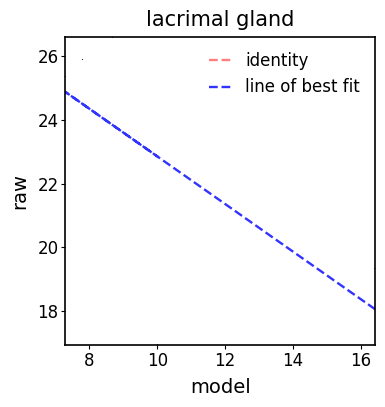

model=SCANVI | metric=cv_cell | n_cells=54:
Mean Absolute Error=3.42,
Pearson correlation=0.41
Spearman correlation=0.36
r^2=-0.70



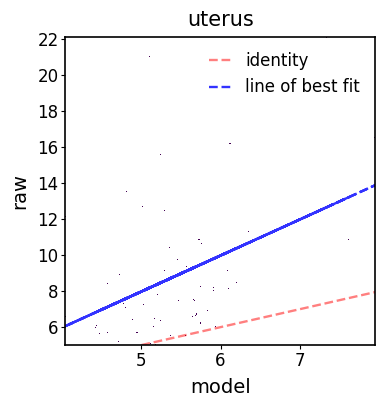

model=SCANVI | metric=cv_cell | n_cells=169:
Mean Absolute Error=5.25,
Pearson correlation=0.17
Spearman correlation=0.24
r^2=-0.85



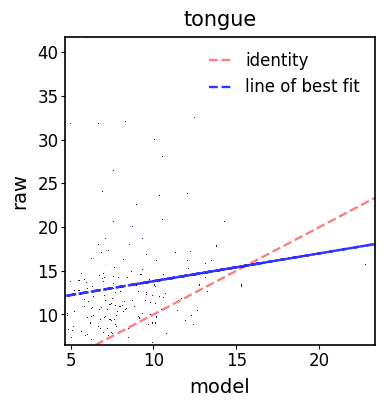

model=SCANVI | metric=cv_cell | n_cells=4158:
Mean Absolute Error=1.83,
Pearson correlation=0.64
Spearman correlation=0.73
r^2=0.30



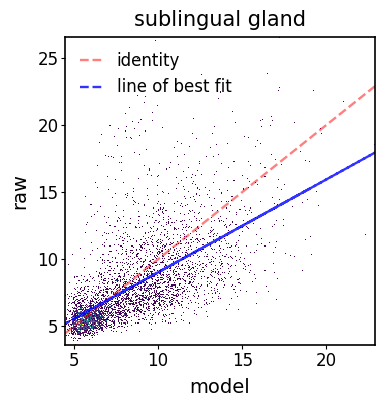

model=SCANVI | metric=cv_cell | n_cells=178:
Mean Absolute Error=2.78,
Pearson correlation=0.08
Spearman correlation=0.15
r^2=-1.00



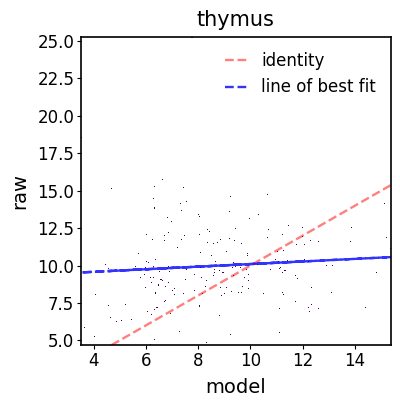

model=SCANVI | metric=cv_cell | n_cells=2940:
Mean Absolute Error=1.88,
Pearson correlation=0.17
Spearman correlation=0.09
r^2=-0.48



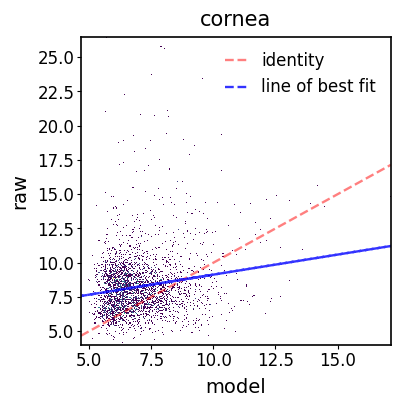

model=SCANVI | metric=cv_cell | n_cells=325:
Mean Absolute Error=3.02,
Pearson correlation=0.23
Spearman correlation=0.25
r^2=-3.67



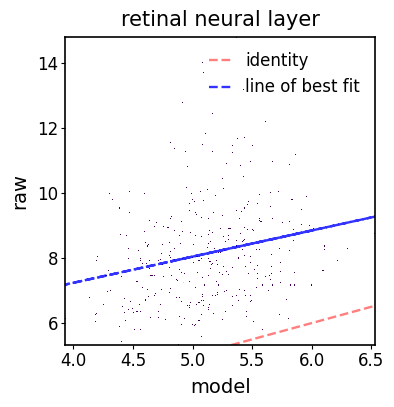

model=SCANVI | metric=cv_cell | n_cells=471:
Mean Absolute Error=1.59,
Pearson correlation=0.26
Spearman correlation=0.28
r^2=-0.09



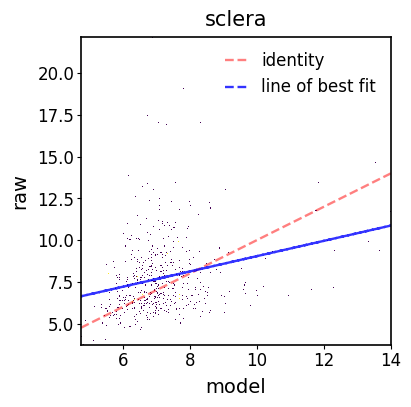

model=SCANVI | metric=cv_cell | n_cells=4151:
Mean Absolute Error=1.30,
Pearson correlation=0.22
Spearman correlation=0.28
r^2=-0.49



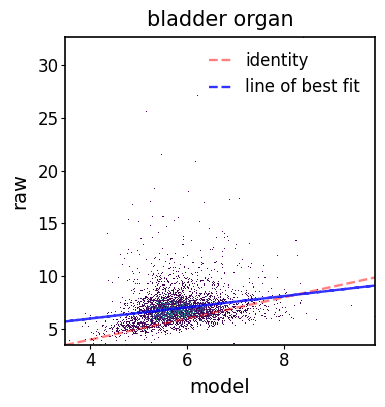

model=SCANVI | metric=cv_cell | n_cells=6220:
Mean Absolute Error=1.94,
Pearson correlation=-0.08
Spearman correlation=0.05
r^2=-0.53



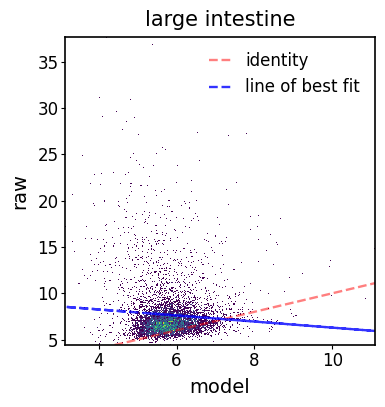

model=SCANVI | metric=cv_cell | n_cells=13981:
Mean Absolute Error=2.24,
Pearson correlation=0.91
Spearman correlation=0.91
r^2=0.82



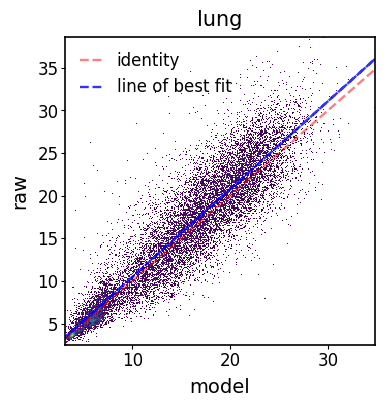

model=SCANVI | metric=cv_cell | n_cells=3712:
Mean Absolute Error=2.92,
Pearson correlation=0.26
Spearman correlation=0.27
r^2=-0.45



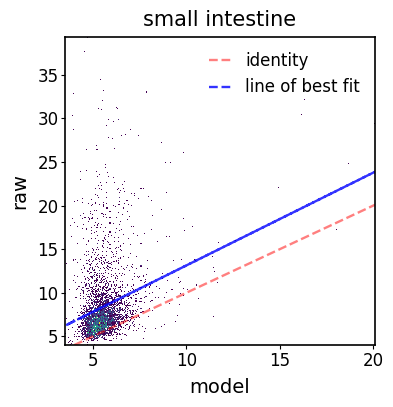

model=SCANVI | metric=cv_cell | n_cells=8331:
Mean Absolute Error=5.21,
Pearson correlation=0.01
Spearman correlation=-0.01
r^2=-2.43



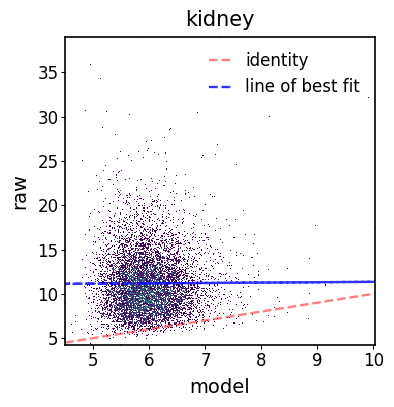

model=SCANVI | metric=cv_cell | n_cells=1087:
Mean Absolute Error=6.81,
Pearson correlation=0.39
Spearman correlation=0.35
r^2=-0.43



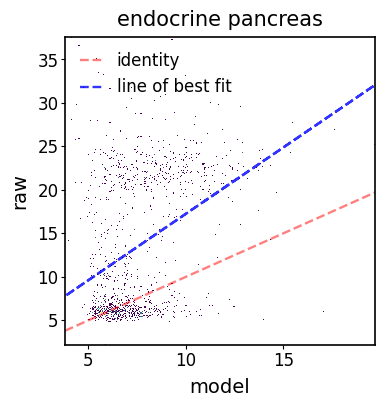

model=SCANVI | metric=cv_cell | n_cells=26:
Mean Absolute Error=2.70,
Pearson correlation=0.07
Spearman correlation=0.08
r^2=-0.66



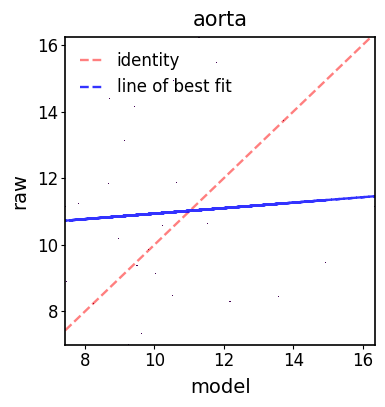

In [108]:
for tissue in query_model.adata.obs['tissue'].unique():
    ppc_plt = PPCPlot(ppc[tissue])
    ppc_plt.plot_cv(model_name="SCANVI", cell_wise=True, plt_type="hist2d")

    fig_path = f'{temp_fig_dir}/ppc_cv_cell_ts_query_{tissue}.svg'
    plt.savefig(fig_path, dpi=600, bbox_inches="tight")
    plt.title(tissue)
    plt.show()

In [23]:
query_model.adata.obs['tissue']=='lung'


AACAGGGCATGTGCTA_TSP6_Liver_NA_10X_1_1             False
AATGAAGTCTAAGGAA_TSP6_Liver_NA_10X_1_1             False
ACAGAAAAGCTGTCCG_TSP6_Liver_NA_10X_1_1             False
ACGATGTTCGACTCCT_TSP6_Liver_NA_10X_1_1             False
ACGTTCCAGAACCCGA_TSP6_Liver_NA_10X_1_1             False
                                                   ...  
TGACAGTAGATGGCGT_TSP2_Vasculature_Aorta_10X_1_2    False
TGTTGGATCGACATCA_TSP2_Vasculature_Aorta_10X_1_2    False
TTGGATGGTGGCTACC_TSP2_Vasculature_Aorta_10X_1_2    False
CTTGATTTCTTGCAAG_TSP2_Vasculature_Aorta_10X_2_2    False
TCGACGGCATGGAATA_TSP2_Vasculature_Aorta_10X_2_2    False
Name: tissue, Length: 104148, dtype: bool

In [24]:
query_model.adata = query_model.adata[query_model.adata.obs['tissue']!='lung']

INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


model=SCANVI | metric=cv_cell | n_cells=90167:
Mean Absolute Error=3.15,
Pearson correlation=0.69
Spearman correlation=0.59
r^2=0.31



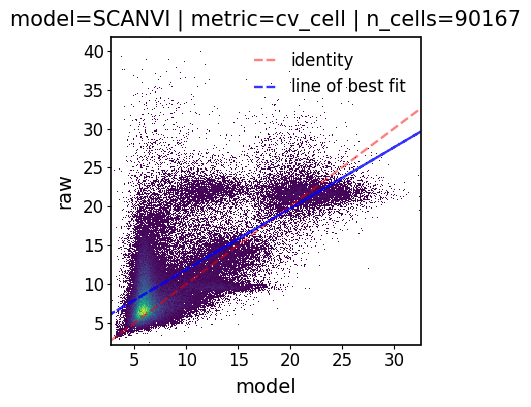

In [25]:
ppc_nolung = criticism.PosteriorPredictiveCheck(query_model.adata[query_model.adata.obs['tissue']!='lung'], models_dict)
# expected runtime ~8min
ppc_nolung.coefficient_of_variation("features")

ppc_plt = PPCPlot(ppc_nolung)
ppc_plt.plot_cv(model_name="SCANVI", cell_wise=True, plt_type="hist2d")

fig_path = f'{temp_fig_dir}/ppc_cv_cell_ts_query_no_lung.svg'
plt.savefig(fig_path, dpi=600, bbox_inches="tight")

In [26]:
query_model2 = query_model
query_model2.adata = query_data[query_data.obs['tissue']=='lung']

INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


model=SCANVI | metric=cv_cell | n_cells=13981:
Mean Absolute Error=2.23,
Pearson correlation=0.91
Spearman correlation=0.91
r^2=0.83



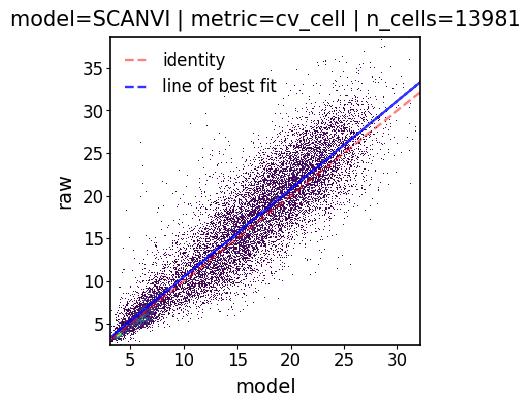

In [27]:
ppc_lung = criticism.PosteriorPredictiveCheck(query_model2.adata[query_model2.adata.obs['tissue']=='lung'], models_dict)
# expected runtime ~8min
ppc_lung.coefficient_of_variation("features")

ppc_plt_lung = PPCPlot(ppc_lung)
ppc_plt_lung.plot_cv(model_name="SCANVI", cell_wise=True, plt_type="hist2d")

fig_path = f'{temp_fig_dir}/ppc_cv_cell_ts_query_lung.svg'
plt.savefig(fig_path, dpi=600, bbox_inches="tight")

model=SCANVI | metric=cv_gene | n_cells=90167:
Mean Absolute Error=37.13,
Pearson correlation=0.37
Spearman correlation=0.40
r^2=-0.35



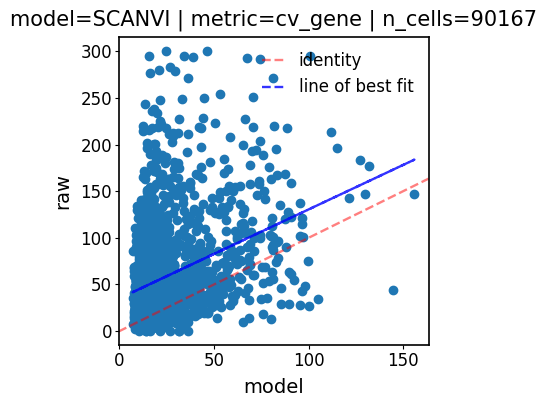

In [28]:
ppc_nolung.coefficient_of_variation("cells")

ppc_plt_nolung = PPCPlot(ppc_nolung)
ppc_plt_nolung.plot_cv(model_name="SCANVI", cell_wise=False, plt_type="scatter")

fig_path = f'{temp_fig_dir}/ppc_cv_cell_ts_query_nolung_cells.svg'
plt.savefig(fig_path, dpi=600, bbox_inches="tight")

In [29]:
b = ppc_lung.metrics['cv_cell']

In [30]:
b[b['SCANVI']==0]

,SCANVI,Raw
cells,,


model=SCANVI | metric=cv_gene | n_cells=13981:
Mean Absolute Error=13.58,
Pearson correlation=0.50
Spearman correlation=0.62
r^2=0.08



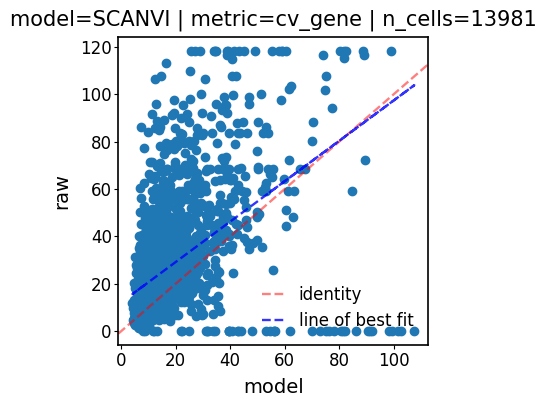

In [31]:
ppc_lung.coefficient_of_variation("cells")

ppc_plt_lung = PPCPlot(ppc_lung)
ppc_plt_lung.plot_cv(model_name="SCANVI", cell_wise=False, plt_type="scatter")

fig_path = f'{temp_fig_dir}/ppc_cv_cell_ts_query_lung_cells.svg'
plt.savefig(fig_path, dpi=600, bbox_inches="tight")

In [32]:
ppc.metrics['cv_cell'].median()

SCANVI    7.139092
Raw       9.558627
dtype: float64

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


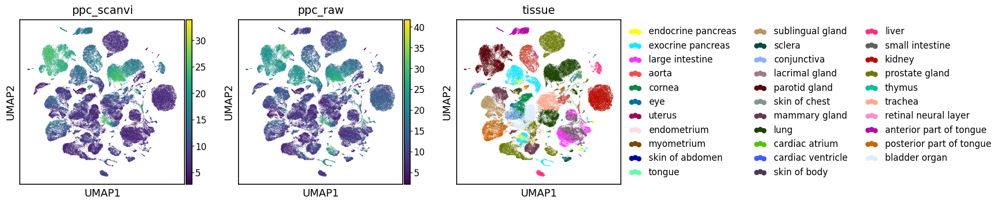

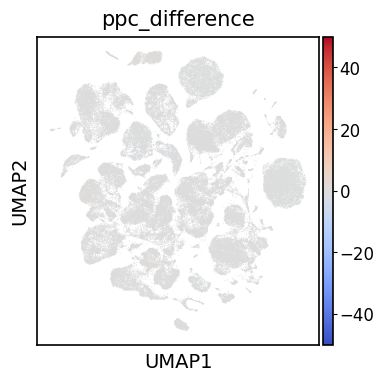

In [33]:
query_data.obs['ppc_scanvi'] = ppc.metrics['cv_cell']['SCANVI']
query_data.obs['ppc_raw'] = ppc.metrics['cv_cell']['Raw']
query_data.obs['ppc_difference'] = (query_data.obs['ppc_scanvi'] - query_data.obs['ppc_raw']) / query_data.obs['ppc_raw']
sc.pl.umap(query_data, color=['ppc_scanvi', 'ppc_raw', 'tissue'])
sc.pl.umap(query_data, color=['ppc_difference'], color_map='coolwarm', vmax=50, vmin=-50)

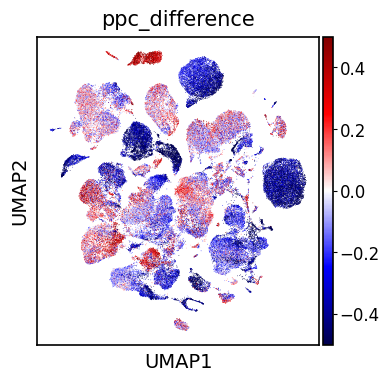

In [39]:
sc.pl.umap(query_data, color=['ppc_difference'], color_map='seismic', vmax=0.5, vmin=-0.5, sort_order=False)

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


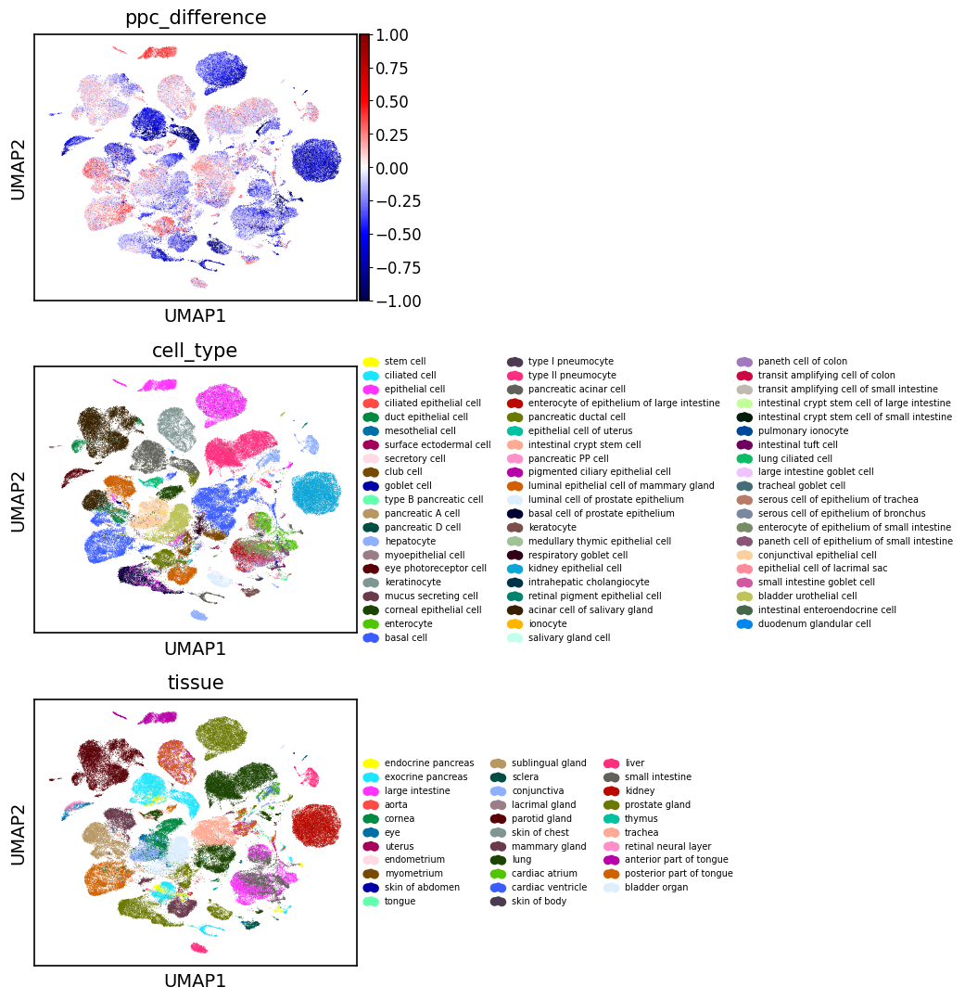

In [41]:
query_data.obs['ppc_difference'] = np.log(query_data.obs['ppc_scanvi'] / query_data.obs['ppc_raw'])
sc.pl.umap(query_data, color=['ppc_difference', 'cell_type', 'tissue'], color_map='seismic', vmax=1.0, vmin=-1.0, ncols=1, legend_fontsize=7, sort_order=False, save='ppc_cells_ts_epithelial.svg')

In [49]:
2

2

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


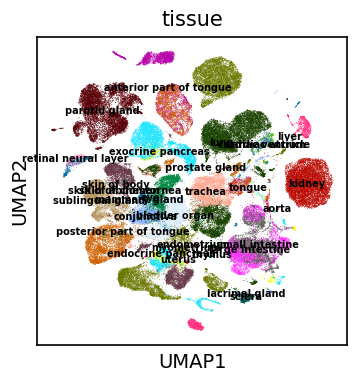

In [43]:
sc.pl.umap(query_data, color=['tissue'], color_map='seismic', vmax=1.0, vmin=-1.0, ncols=1, legend_fontsize=7, sort_order=False, legend_loc='on data')

In [44]:
# expected runtime ~8min
ppc.coefficient_of_variation("cells")

In [45]:
ppc.metrics['cv_gene'] = np.log(ppc.metrics['cv_gene'])

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/pandas/core/internals/blocks.py:351: RuntimeWarning: divide by zero encountered in log
  result = func(self.values, **kwargs)


In [46]:
ppc.metrics['cv_gene'][ppc.metrics['cv_gene'] < 0] = 0

model=SCANVI | metric=cv_gene | n_cells=104148:
Mean Absolute Error=0.80,
Pearson correlation=0.45
Spearman correlation=0.47
r^2=-0.63



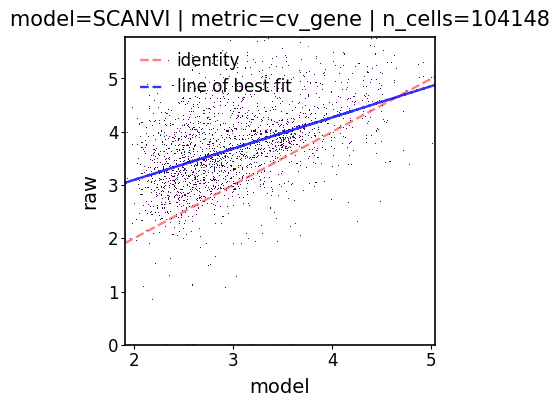

In [47]:
ppc_plt = PPCPlot(ppc)
ppc_plt.plot_cv(model_name="SCANVI", cell_wise=False, plt_type="hist2d")

fig_path = f'{temp_fig_dir}/ppc_cv_gene.svg'
plt.savefig(fig_path, dpi=600, bbox_inches="tight")

model=SCANVI | metric=cv_cell | n_cells=104148:
Mean Absolute Error=3.02,
Pearson correlation=0.76
Spearman correlation=0.67
r^2=0.46



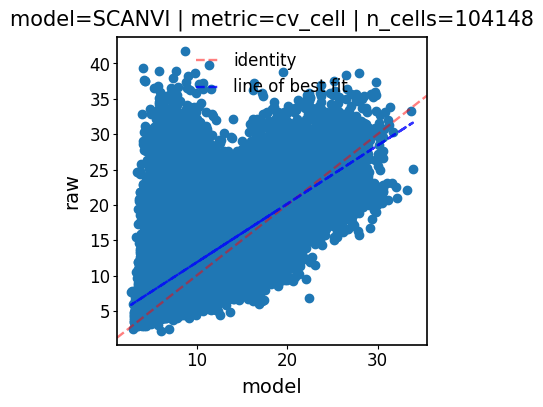

In [48]:
ppc_plt = PPCPlot(ppc)
ppc_plt.plot_cv(model_name="SCANVI", cell_wise=True, plt_type="scatter")

## 3️⃣ Goodness of fit with PPC + DE

In [ ]:
# expected runtime <1min
ppc.differential_expression(de_groupby="celltypes", p_val_thresh=0.2)

In [ ]:
ppc.metrics["diff_exp"]["summary"]

,gene_overlap_f1,lfc_mae,lfc_pearson,lfc_spearman,roc_auc,pr_auc,group,model
0,0.96,1.252667,0.673183,0.882827,0.162301,0.9531,AT1,SCANVI
1,0.97,0.271882,0.902502,0.978719,0.17526,0.989244,AT2,SCANVI
2,0.95,0.79072,0.763508,0.931908,0.238895,0.957648,B cell lineage,SCANVI
3,0.98,0.249239,0.937037,0.993082,0.300719,0.98499,Basal,SCANVI
4,0.92,0.545563,0.771461,0.966467,0.339232,0.95753,Dendritic cells,SCANVI
5,0.96,1.197084,0.71593,0.931989,0.277,0.967032,EC arterial,SCANVI
6,0.98,0.634074,0.84523,0.965342,0.259146,0.985132,EC capillary,SCANVI
7,0.95,0.680383,0.793643,0.953001,0.255449,0.964584,EC venous,SCANVI
8,0.93,0.417005,0.890982,0.980246,0.292585,0.973317,Fibroblasts,SCANVI
9,0.96,0.623895,0.826804,0.966016,0.267463,0.975099,Innate lymphoid cell NK,SCANVI


Plot the summary results

/home/cane/Documents/yoseflab/can/scvi-hub/scvi-hub-reproducibility/ppc_plot_utils.py:194: UserWarning: The palette list has more values (10) than needed (4), which may not be intended.
  sns.stripplot(model_de_metrics, size=4, color=".3", linewidth=1, palette=sns.color_palette("pastel"))


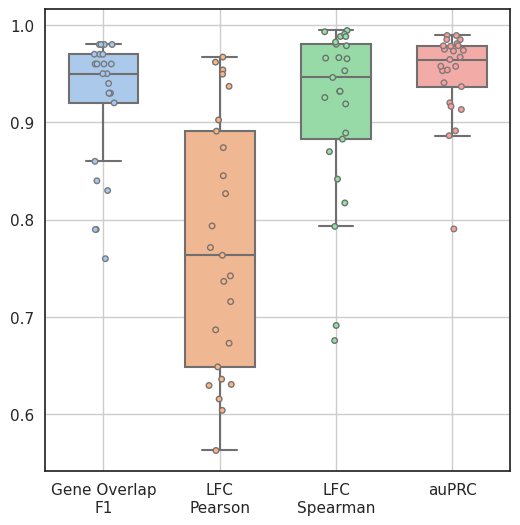

In [ ]:
ppc_plt = PPCPlot(ppc)
ppc_plt.plot_diff_exp(
    "SCANVI",
    plot_kind="summary_box_with_obs",
)
fig_path = f'{temp_fig_dir}/de_summary_violin.svg'
plt.savefig(fig_path, dpi=300, bbox_inches="tight")
plt.show()

Plot per-group LFC scatterplots.

In [1]:
2

2

Index(['ENSG00000211673', 'ENSG00000169347', 'ENSG00000167419',
       'ENSG00000184908', 'ENSG00000244575', 'ENSG00000169035',
       'ENSG00000278196', 'ENSG00000211659', 'ENSG00000183813',
       'ENSG00000243290',
       ...
       'ENSG00000086300', 'ENSG00000103534', 'ENSG00000141934',
       'ENSG00000185215', 'ENSG00000242574', 'ENSG00000119888',
       'ENSG00000182853', 'ENSG00000189143', 'ENSG00000121858',
       'ENSG00000121552'],
      dtype='object', name='names', length=429)

In [ ]:
bd = model.adata[
    model.adata.obs["ann_level_3"]=='Smooth muscle FAM83D+', ppc.metrics['diff_exp']['lfc_per_model_per_group']['SCANVI']['Smooth muscle FAM83D+'][
        np.abs(ppc.metrics['diff_exp']['lfc_per_model_per_group']['SCANVI']['Smooth muscle FAM83D+']['raw'] - ppc.metrics['diff_exp']['lfc_per_model_per_group']['SCANVI']['Smooth muscle FAM83D+']['approx'])>20].index
]

In [ ]:
model.adata.obs['ann_level_3'].value_counts()

Macrophages                     111844
Basal                            84713
Secretory                        80327
AT2                              62405
T cell lineage                   50859
Multiciliated lineage            41098
Monocytes                        26529
EC capillary                     23205
Fibroblasts                      20384
Innate lymphoid cell NK          16978
EC venous                        12975
Dendritic cells                  10319
AT1                               7937
EC arterial                       7391
Mast cells                        6623
B cell lineage                    6284
Submucosal Secretory              4700
Lymphatic EC mature               4001
None                              3286
Rare                               885
Myofibroblasts                     716
Lymphatic EC differentiating       566
SM activated stress response       556
Smooth muscle FAM83D+              335
Lymphatic EC proliferating          28
Name: ann_level_3, dtype:

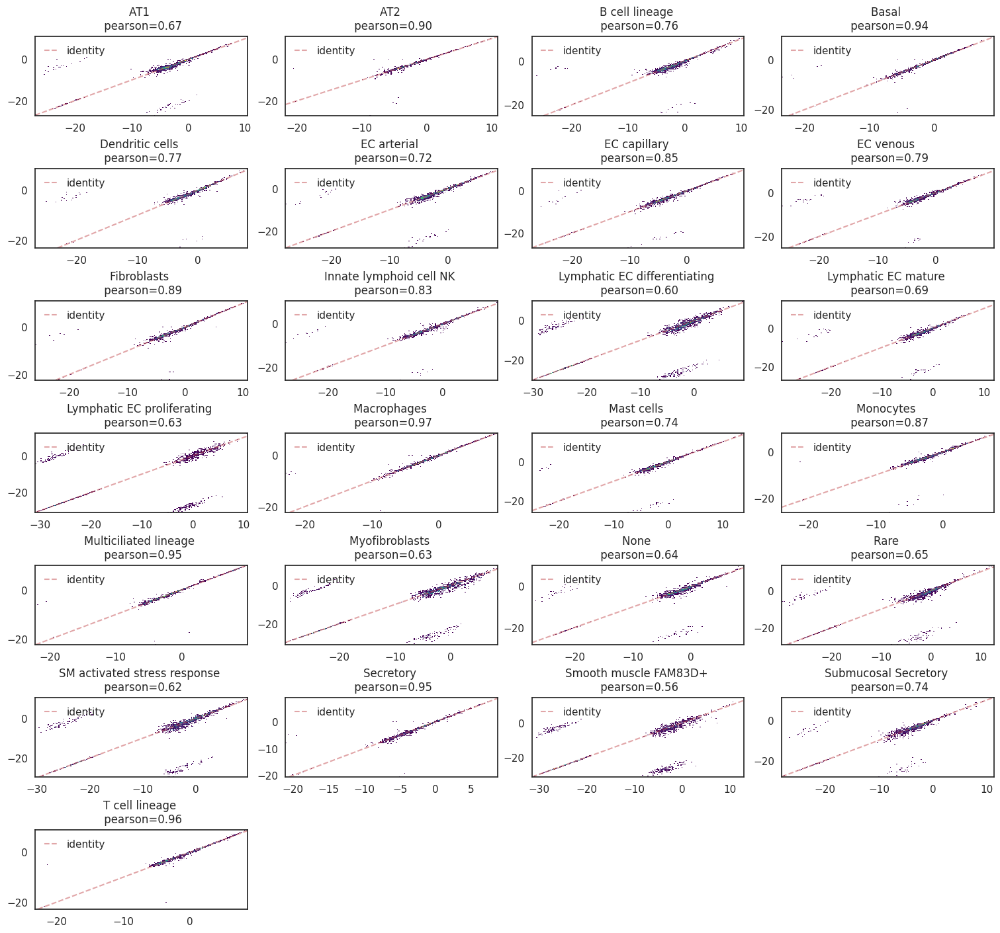

In [ ]:
ppc_plt = PPCPlot(ppc)
ppc_plt.plot_diff_exp(
    "SCANVI",
    plot_kind="lfc_scatterplots",
)
fig_path = f'{temp_fig_dir}/de_per_group_lfc_scatter.svg'
plt.savefig(fig_path, dpi=300, bbox_inches="tight")
plt.show()